## Summary 

Author: Trenton Bricken

Reproducing the convergence plot of Figure 7.3 from the SDM book. Investigating further tradeoffs for different convergences with various parameters with these results presented in the appendix. 

In [5]:
%load_ext autoreload
%autoreload 2
from Convergence_Functions import *
#from Alternative_SDM_Designs import *
from SDM_Circ_Inter_Funcs import space_frac_to_hamm_radius

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import binom, norm
from scipy.sparse import csc_matrix, coo_matrix, csr_matrix
import pandas as pd
import time
import scipy.integrate as integrate
from types import SimpleNamespace
import seaborn as sns
import pandas as pd

In [7]:
n = 64
r = 100000
m = 1000
hamm_dist = 17
normalize=True
drang_interval=1
printt = False

In [3]:
space_frac_to_hamm_radius(n,[0.000001])

[14]

# SDM Memory Capacity

In [9]:
def compute_bitdist_critdist(n,hamm_dist,r,
                                m,drang_interval, print_things = False):
    
    dvals = np.arange(0,n//2, drang_interval)
    dvals = np.append(dvals, n//2) # needs to be at the end for the indifference distance calc
    target_freqs = expected_intersection_lune(n, dvals, hamm_dist, r)
    algo_max_dist = target_freqs[-1]
    sigmas = np.sqrt( target_freqs + ( (m-1)*(algo_max_dist+algo_max_dist**2) ) )

    snrs = target_freqs/sigmas

    # crit dist TODO: USE THE FUNCTIONS IN CONVERGENCE FUNCTIONS
    fidelity = norm.cdf(snrs)
    bits_distances = n - (fidelity*n)
    npp = np.asarray( bits_distances - dvals )
    
    if print_things:
        print('target_fs', target_freqs)
    if (npp[~np.isnan(npp)]<0.01).all(): # if all convergence of everything then set to max value. 
        
        # if there are nans then take the last real value: 
        if np.isnan(npp).sum()>1:
            crit_dist = dvals[len(npp[~np.isnan(npp)])]
        #else take the largest value tried as the crit dist: 
        else: 
            crit_dist = dvals[-1]
    else: # take first one to cross over. 
        # we index by +3 because if it is one of the very first ones these can often be close to 0 and throw everything off. 
        crit_dist = dvals[np.argmax(npp[5:]>0)+5-1]
    
    if printt:
        plt.figure()
        plt.plot(dvals, bits_distances, label='Update')
        plt.plot(dvals, dvals, label='$x=y$')
        plt.show()
    
    # checks if the critical distance is in fact 0 as it curves the wrong way. 
    check_ind = crit_dist//(drang_interval*2)
    if bits_distances[check_ind] > dvals[check_ind]:
        crit_dist = 0
        #print('critical distance plot curves wrong way thus crit dist = 0')
    
    return bits_distances, crit_dist, dvals
    
    
    

# Jaeckell Better Variance

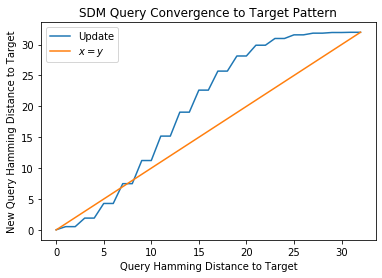

6

In [11]:

bits_distances, crit_dist, dvals = compute_bitdist_critdist(n,hamm_dist,r,
                                m,drang_interval)
plt.plot(dvals, bits_distances, label='Update')
plt.plot(dvals, dvals, label='$x=y$')
plt.legend()
plt.xlabel("Query Hamming Distance to Target")
plt.ylabel("New Query Hamming Distance to Target")
plt.title("SDM Query Convergence to Target Pattern")
plt.gcf().savefig('figures/New_Variance_Lune_SDMNewQueryConvergence'+str(n)+'.png', dpi=250)
plt.show()

crit_dist

# Varying the number of patterns, m

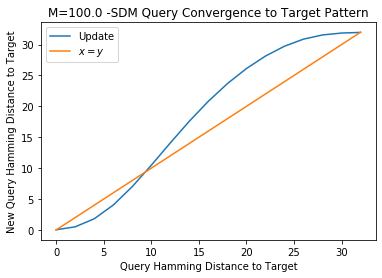

crit_dist= 8


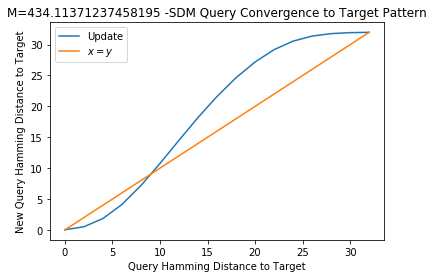

crit_dist= 8


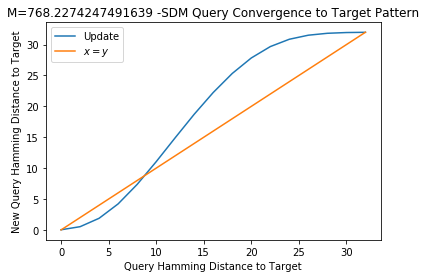

crit_dist= 8


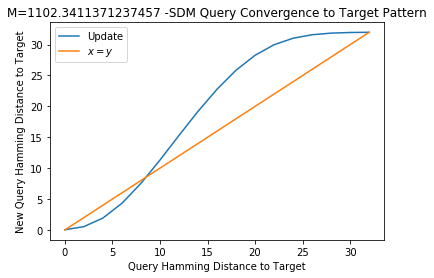

crit_dist= 8


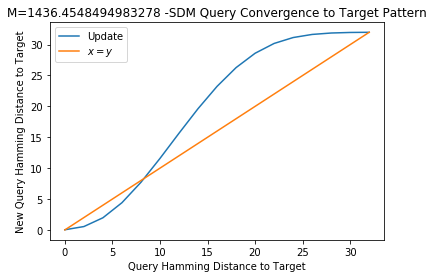

crit_dist= 8


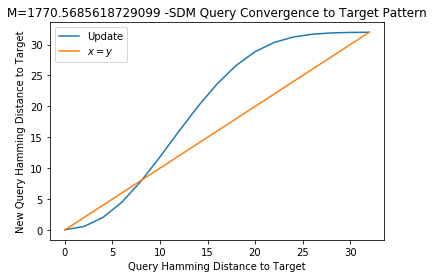

crit_dist= 8


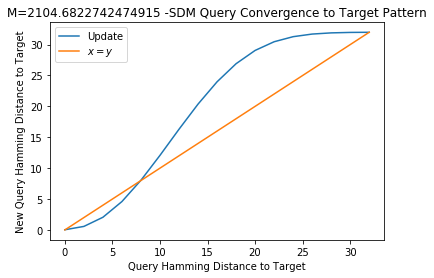

crit_dist= 8


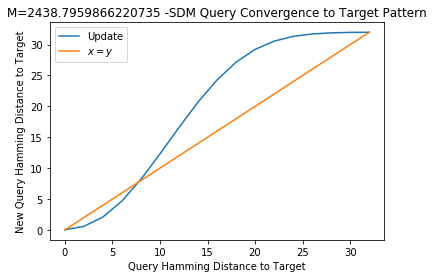

crit_dist= 8


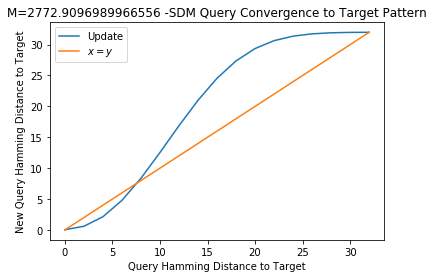

crit_dist= 8


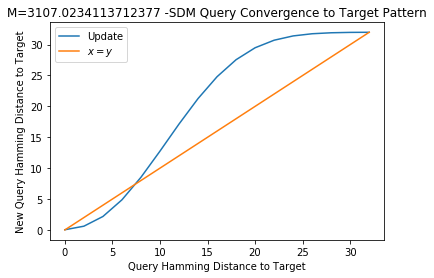

crit_dist= 8


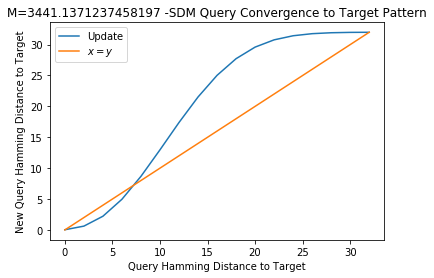

crit_dist= 8


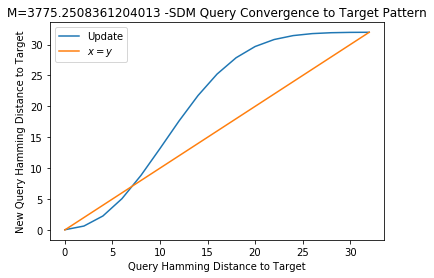

crit_dist= 8


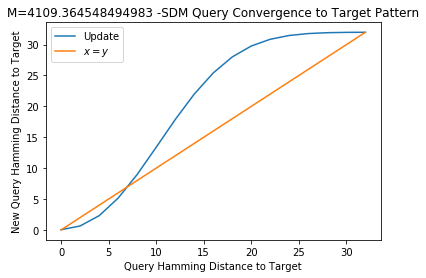

crit_dist= 8


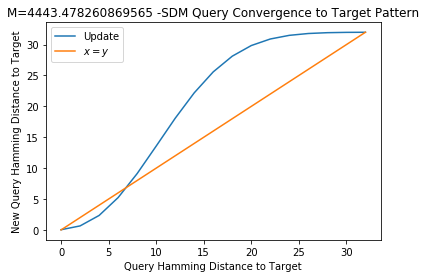

crit_dist= 8


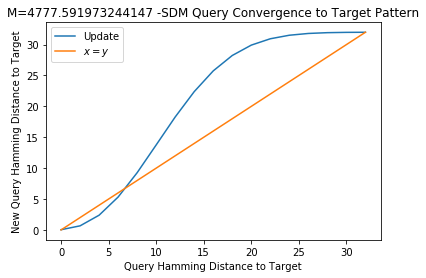

crit_dist= 8


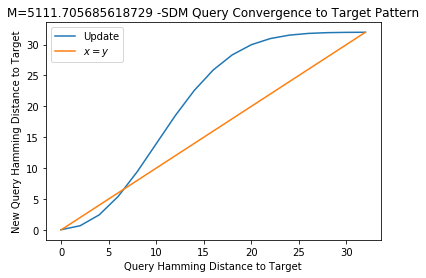

crit_dist= 8


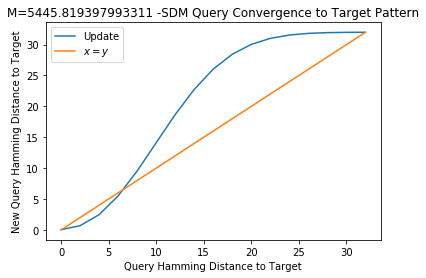

crit_dist= 8


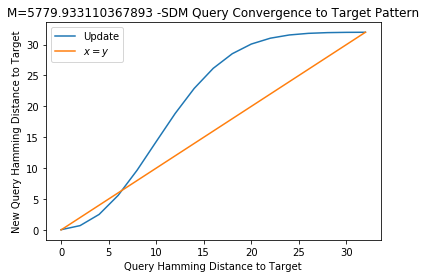

crit_dist= 8


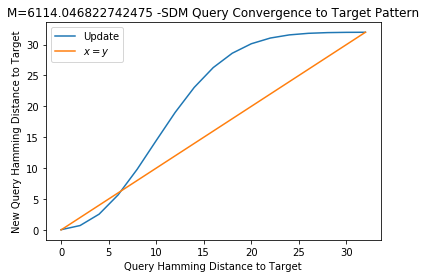

crit_dist= 8


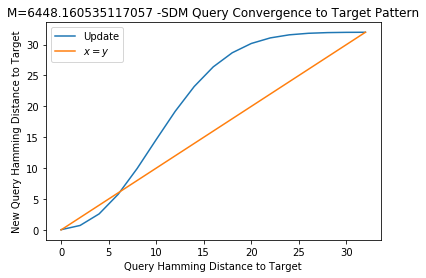

crit_dist= 8


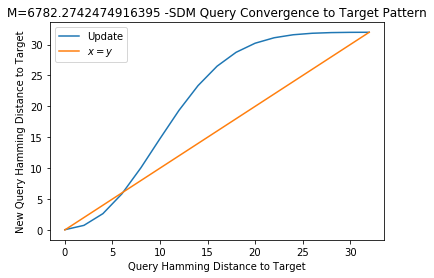

crit_dist= 8


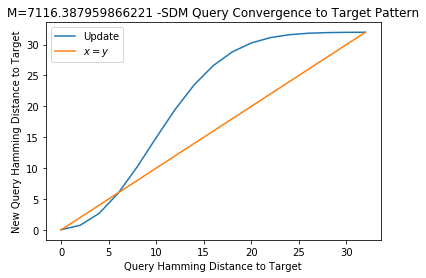

crit_dist= 8


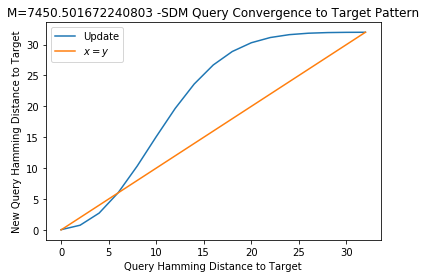

crit_dist= 8


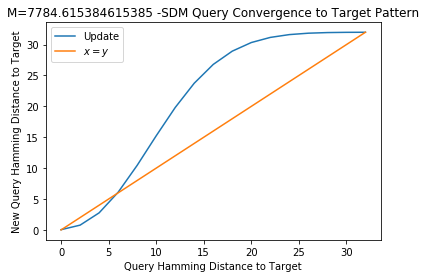

crit_dist= 8


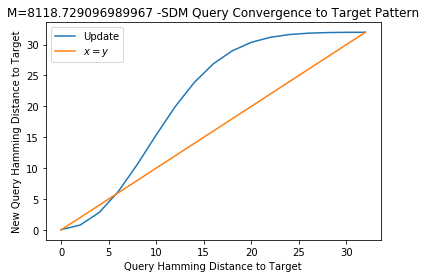

crit_dist= 8


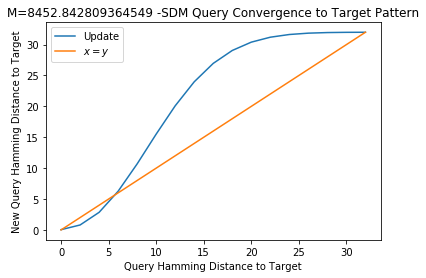

crit_dist= 8


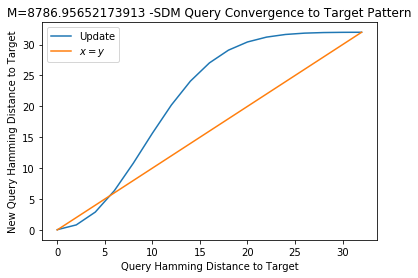

crit_dist= 8


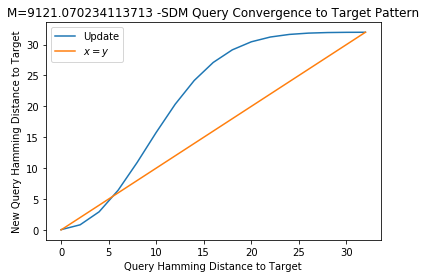

crit_dist= 8


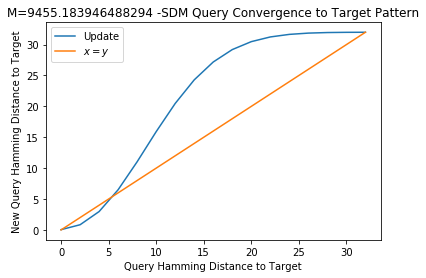

crit_dist= 8


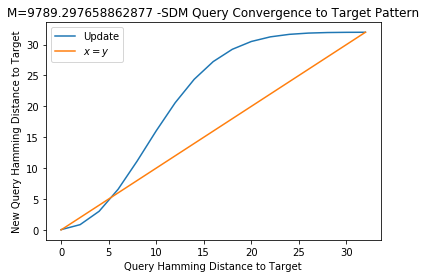

crit_dist= 8


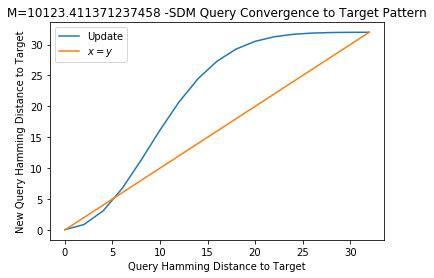

crit_dist= 8


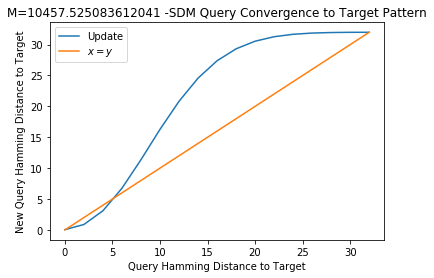

crit_dist= 8


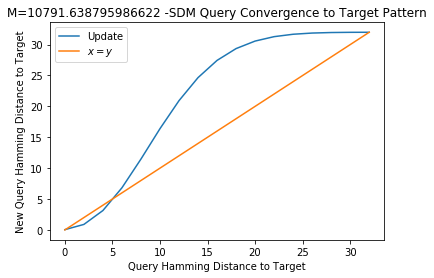

crit_dist= 8


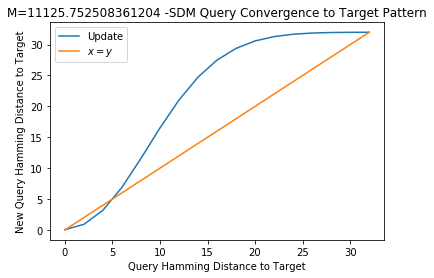

crit_dist= 8


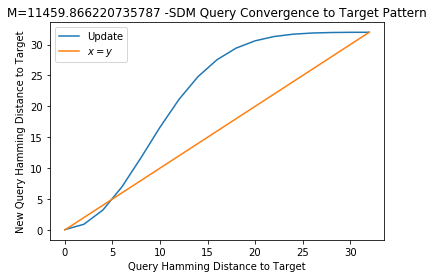

crit_dist= 8


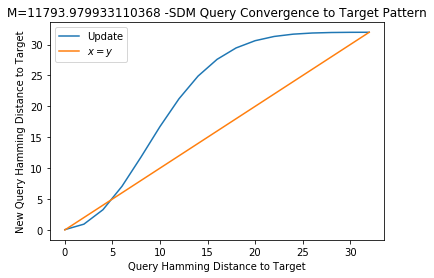

crit_dist= 8


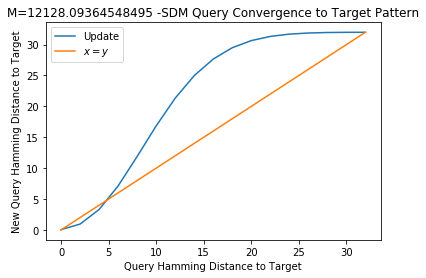

crit_dist= 8


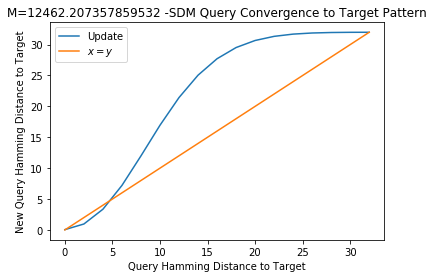

crit_dist= 8


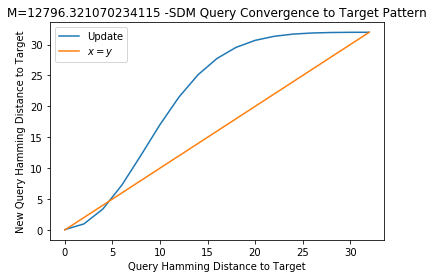

crit_dist= 8


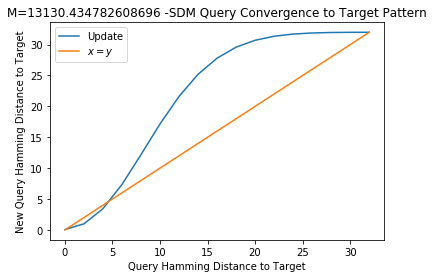

crit_dist= 8


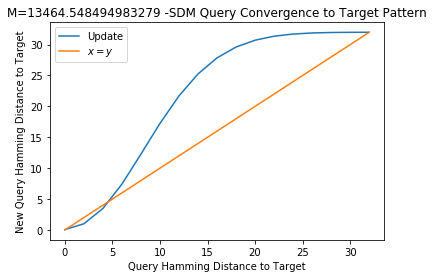

crit_dist= 8


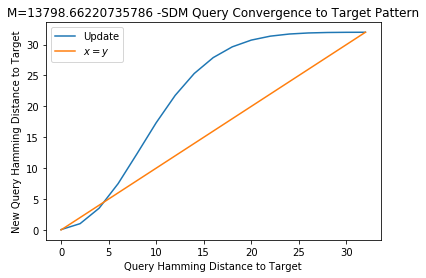

crit_dist= 8


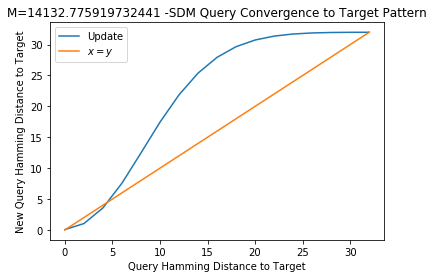

crit_dist= 8


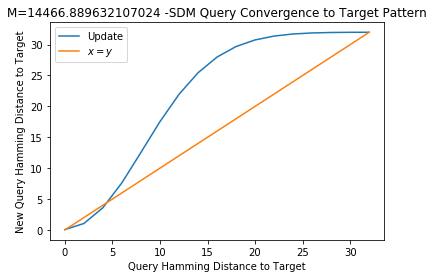

crit_dist= 8


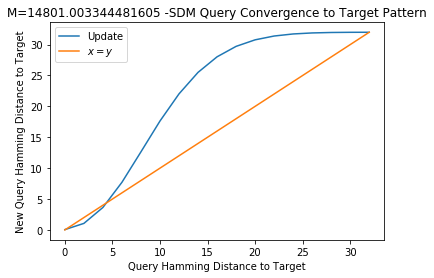

crit_dist= 8


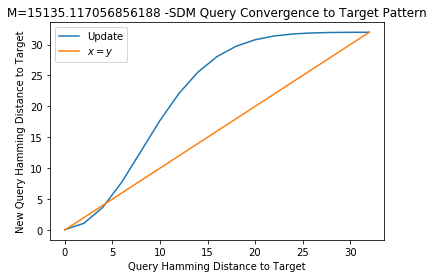

crit_dist= 8


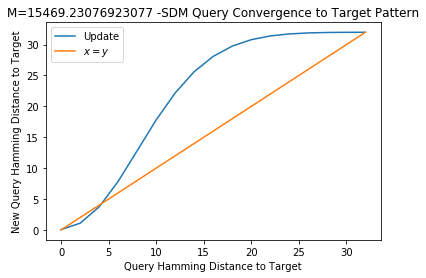

crit_dist= 8


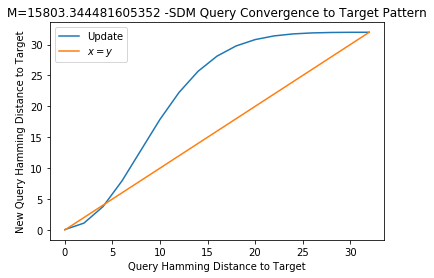

crit_dist= 8


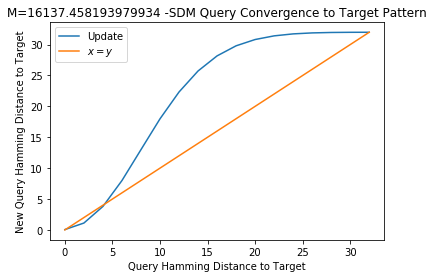

crit_dist= 8


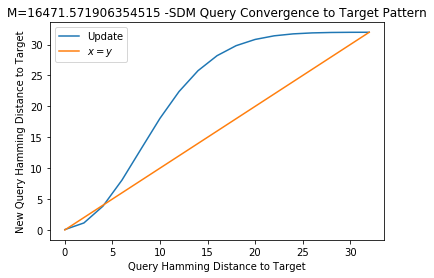

crit_dist= 8


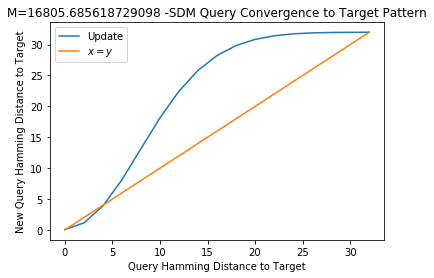

crit_dist= 8


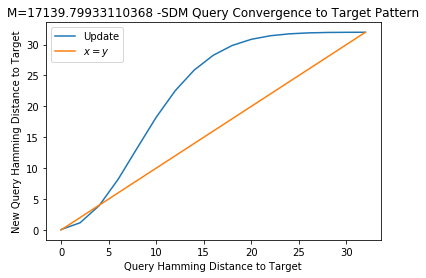

crit_dist= 8


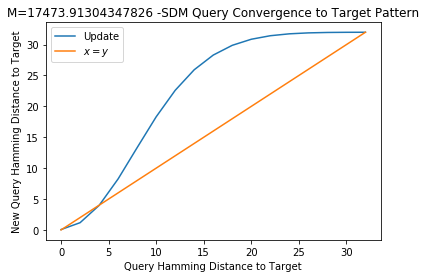

crit_dist= 8
critical distance plot curves wrong way thus crit dist = 0


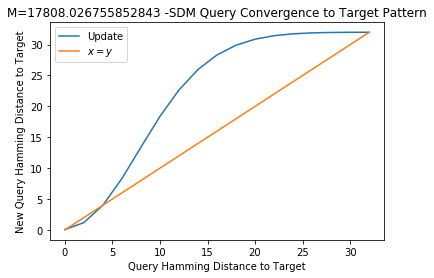

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


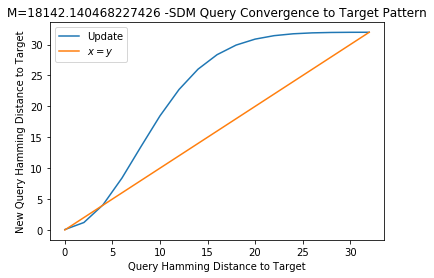

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


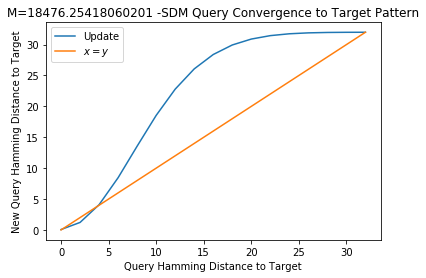

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


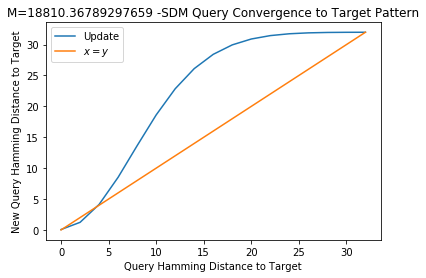

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


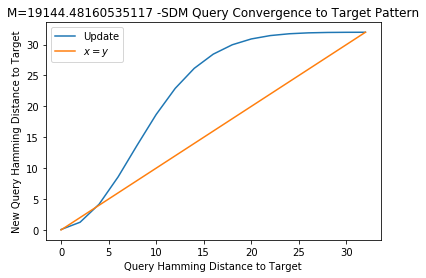

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


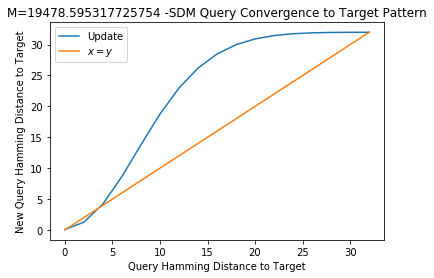

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


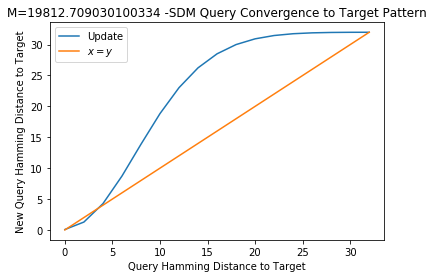

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


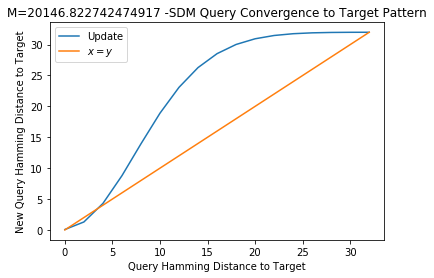

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


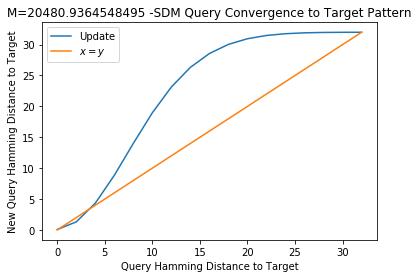

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


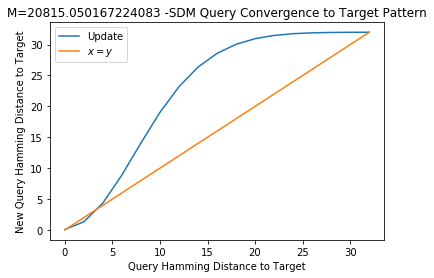

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


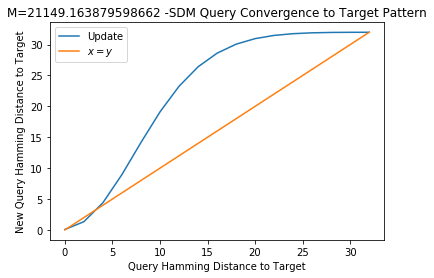

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


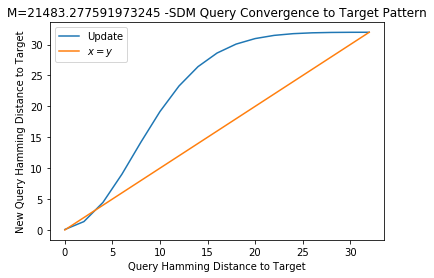

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


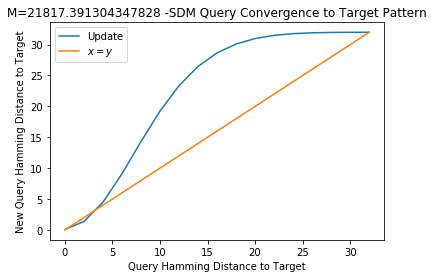

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


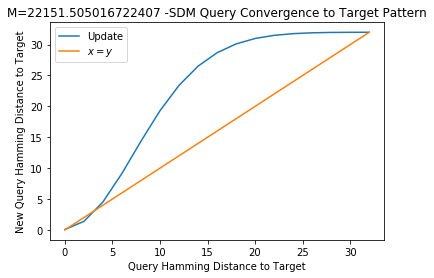

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


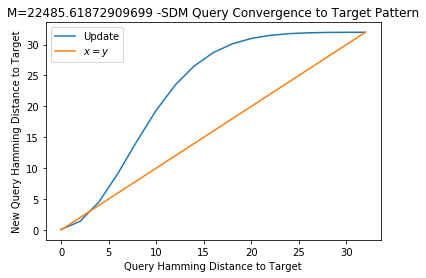

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


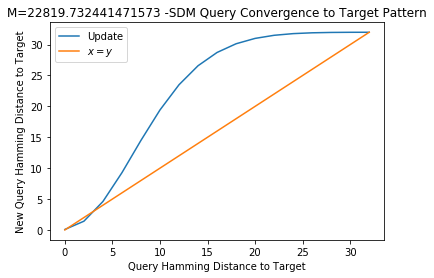

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


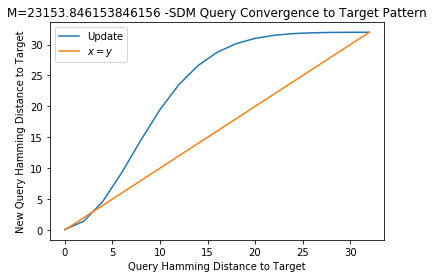

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


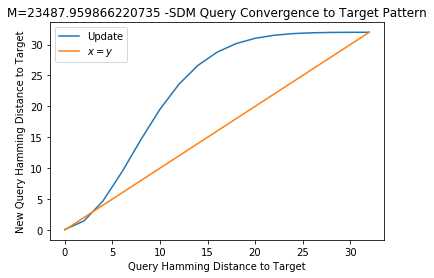

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


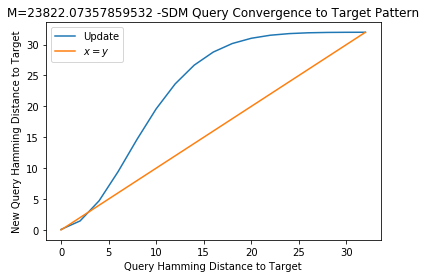

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


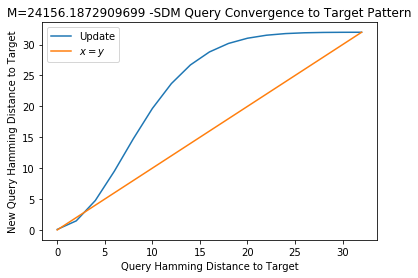

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


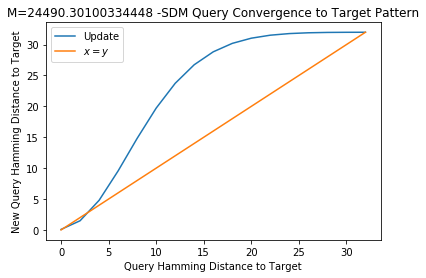

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


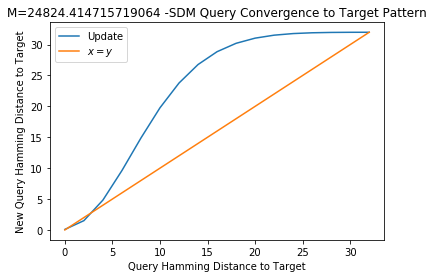

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


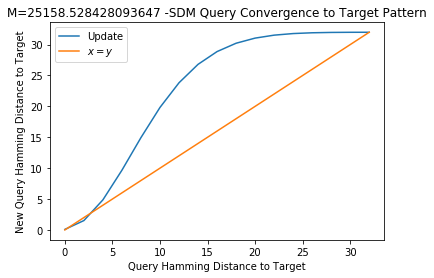

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


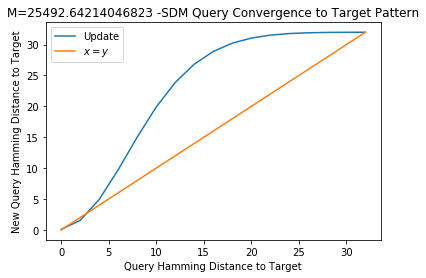

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


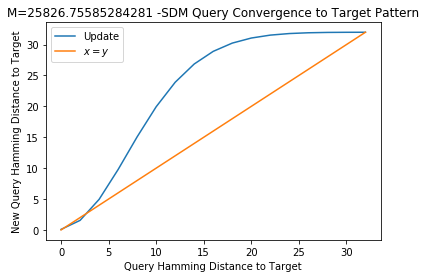

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


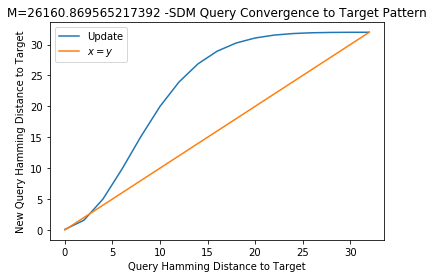

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


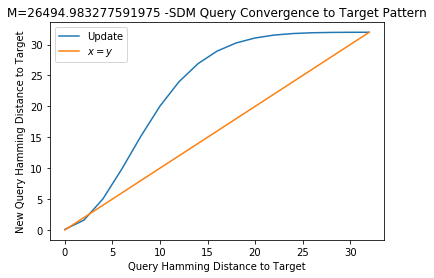

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


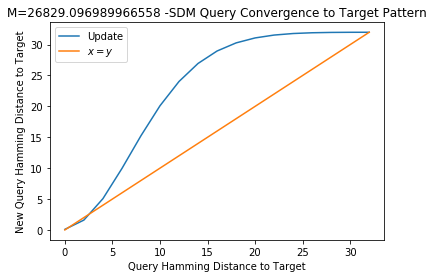

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


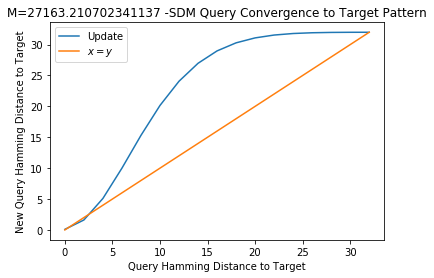

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


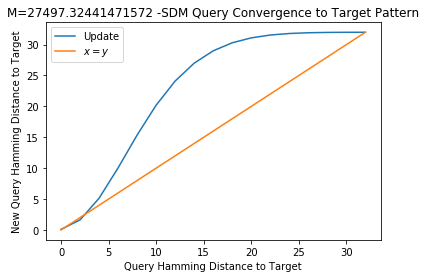

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


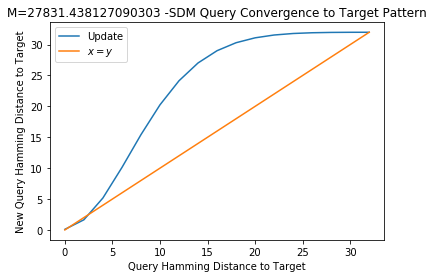

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


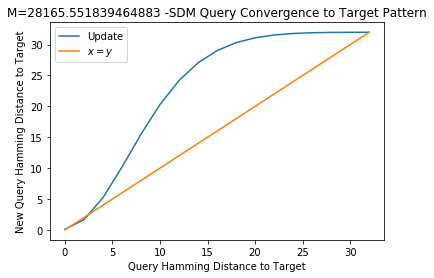

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


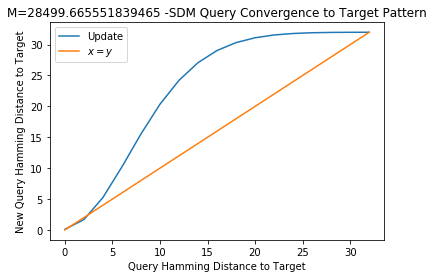

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


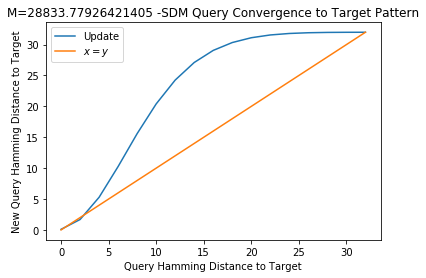

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


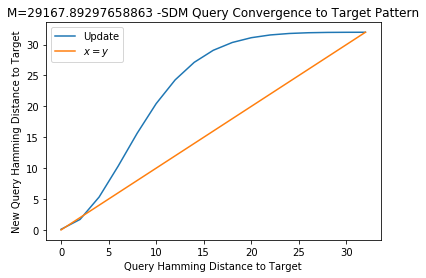

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


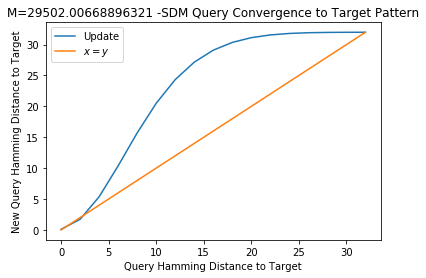

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


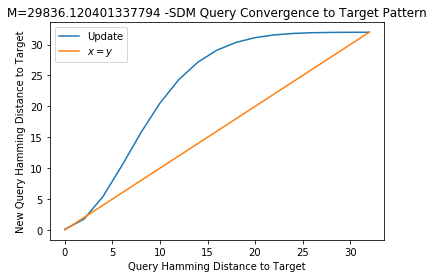

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


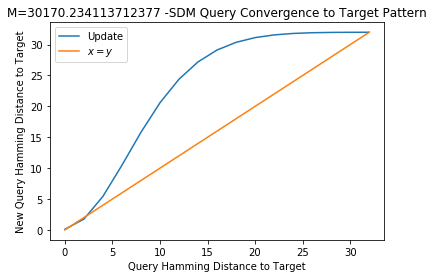

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


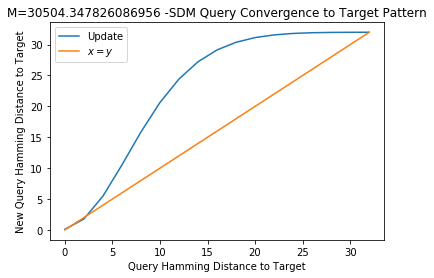

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


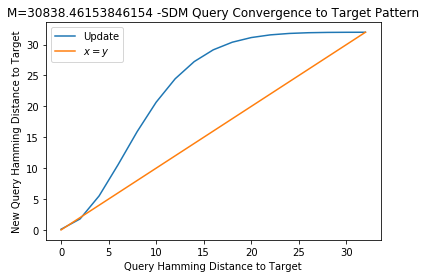

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


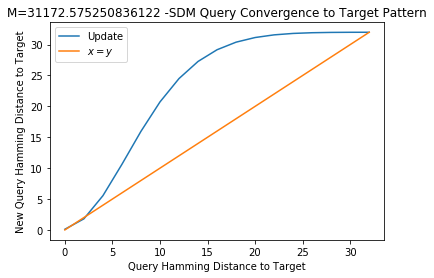

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


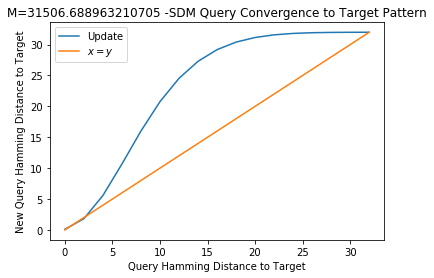

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


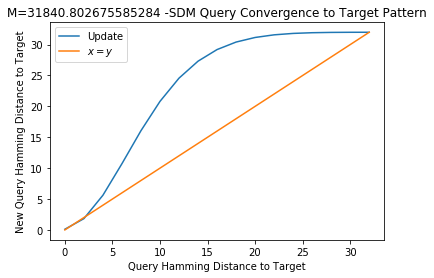

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


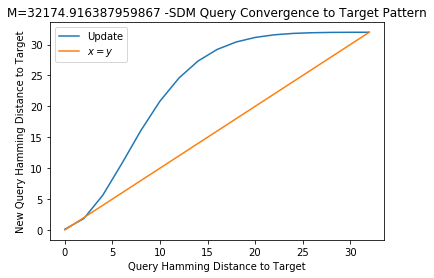

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


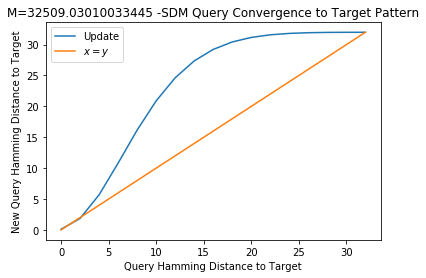

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


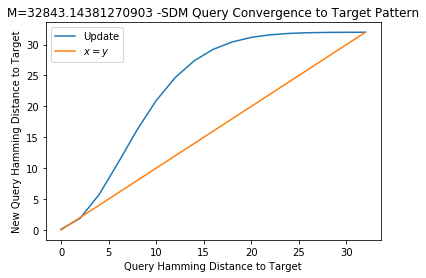

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


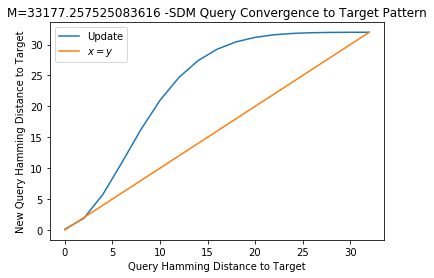

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


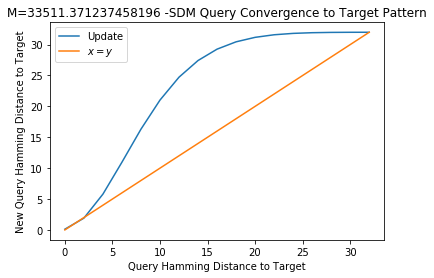

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


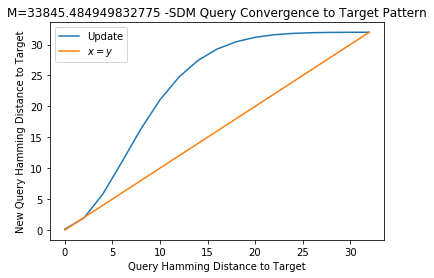

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


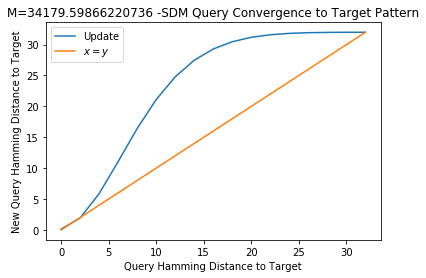

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


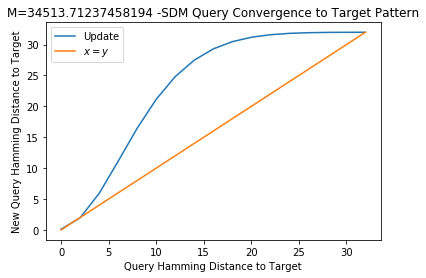

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


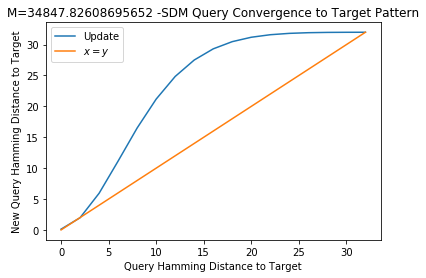

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


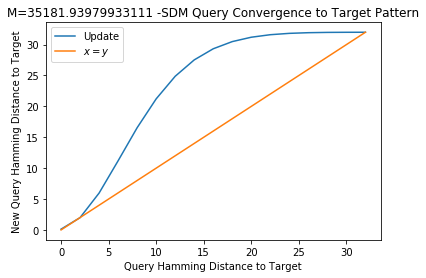

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


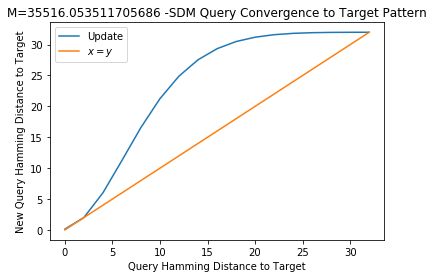

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


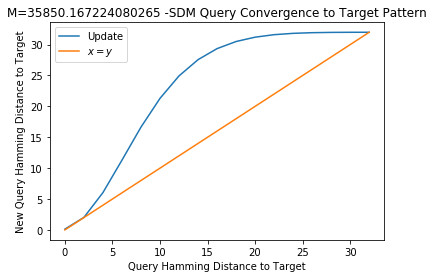

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


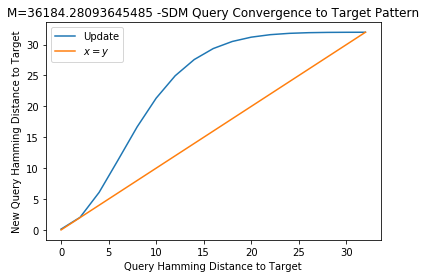

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


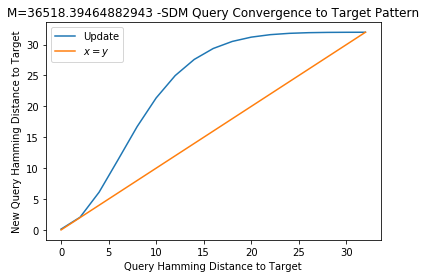

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


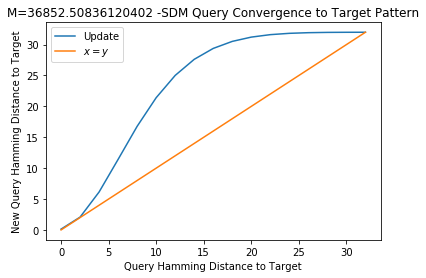

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


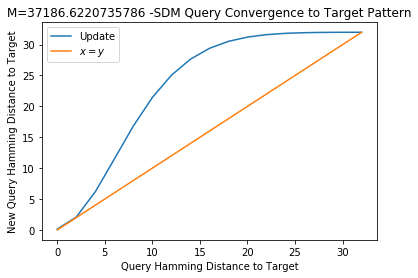

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


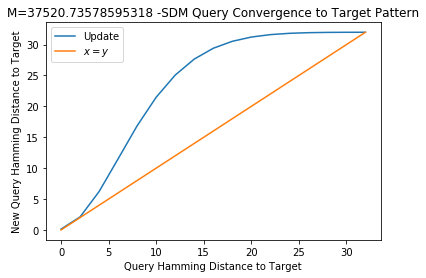

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


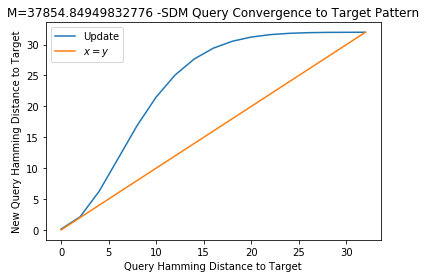

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


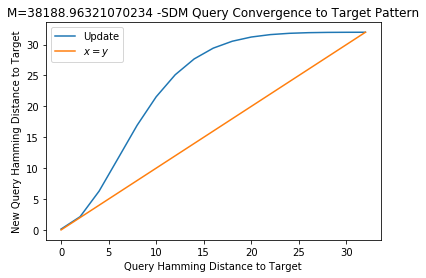

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


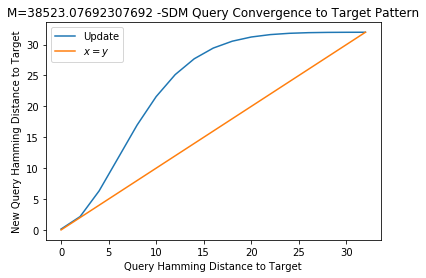

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


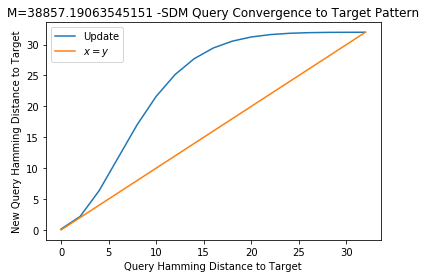

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


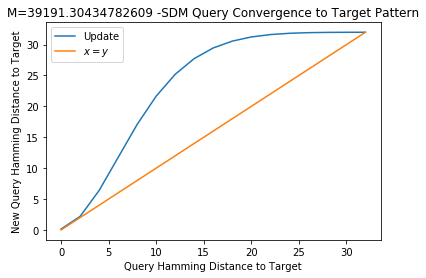

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


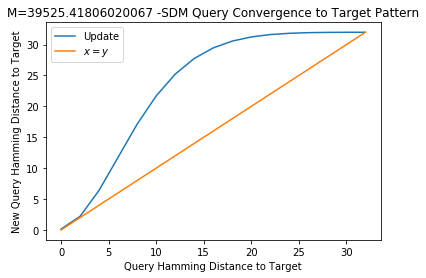

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


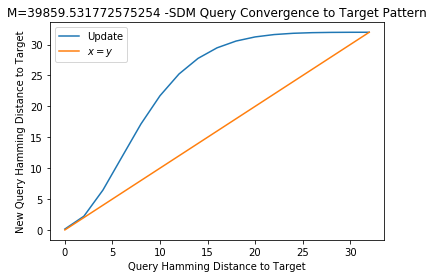

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


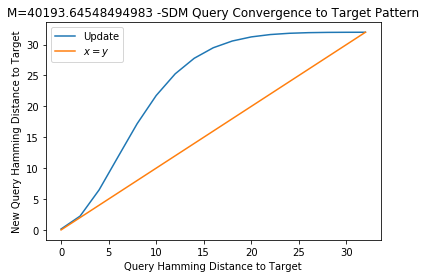

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


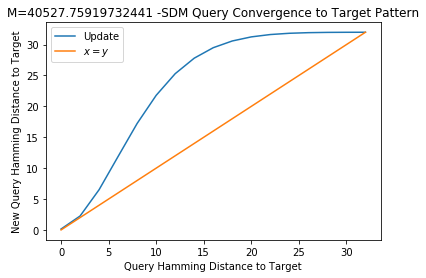

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


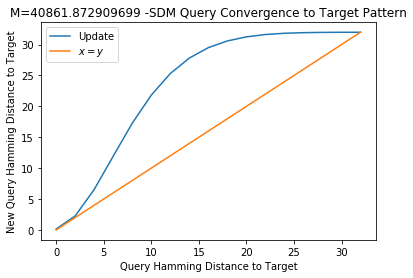

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


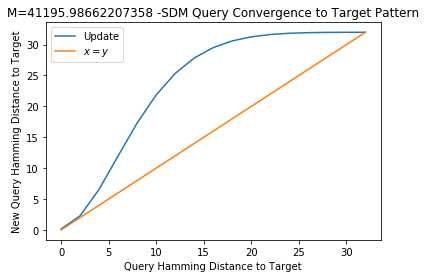

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


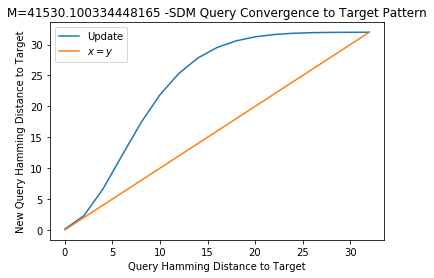

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


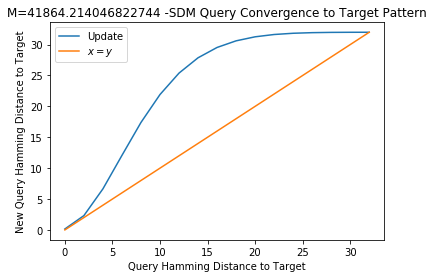

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


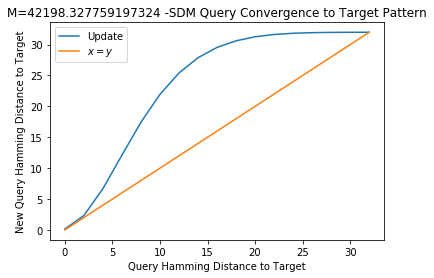

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


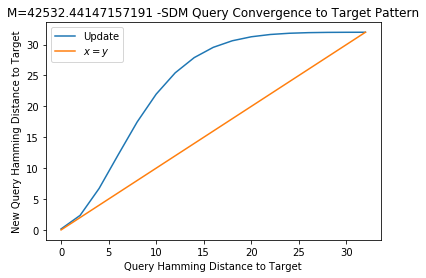

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


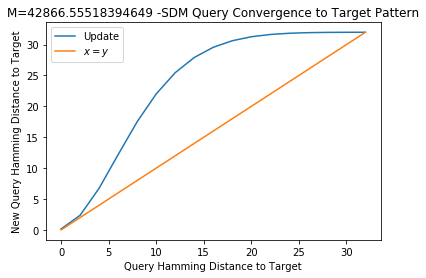

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


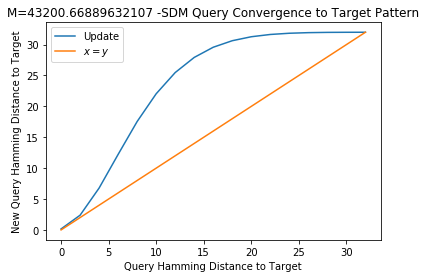

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


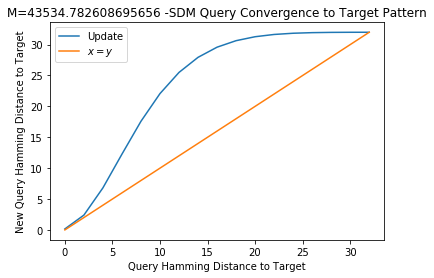

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


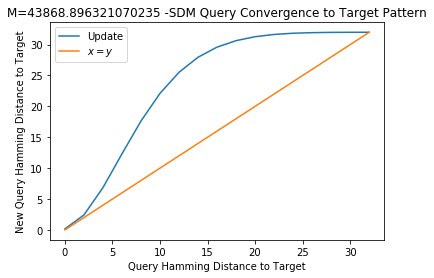

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


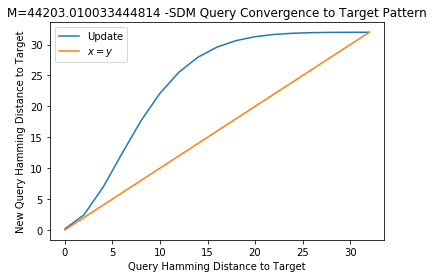

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


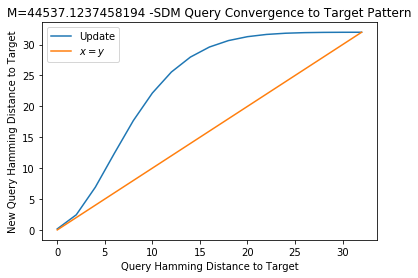

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


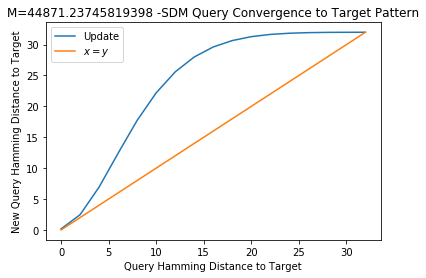

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


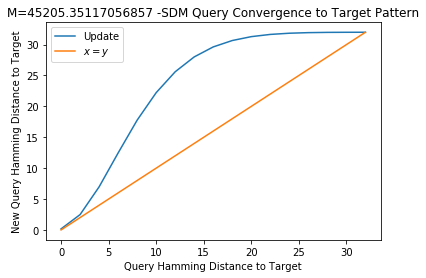

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


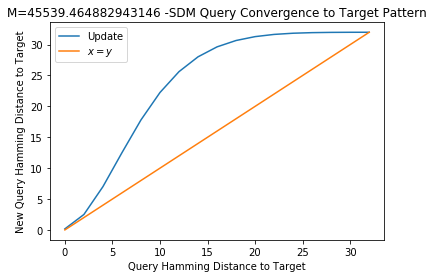

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


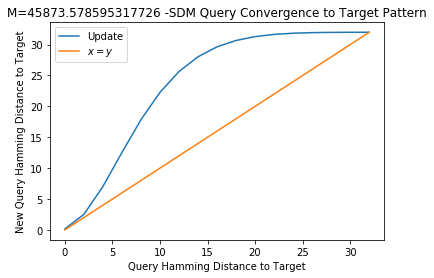

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


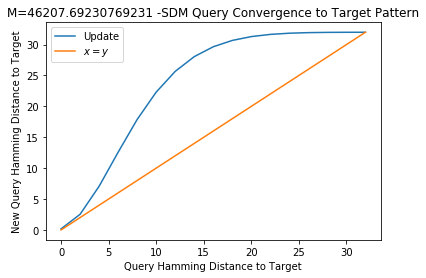

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


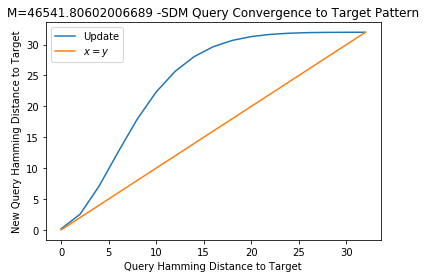

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


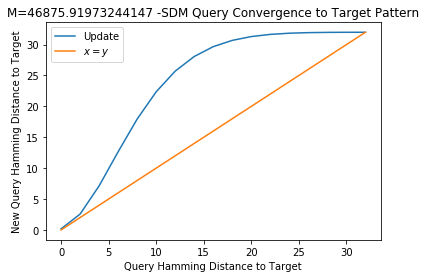

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


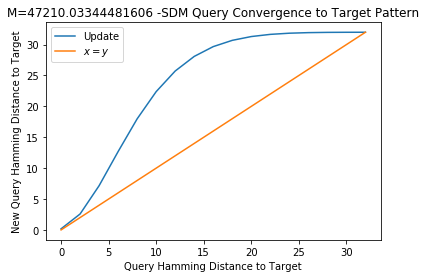

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


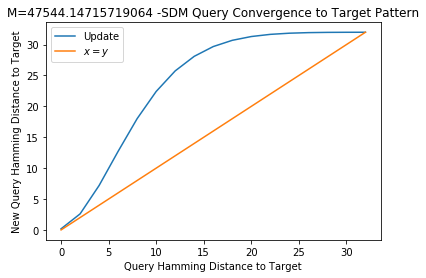

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


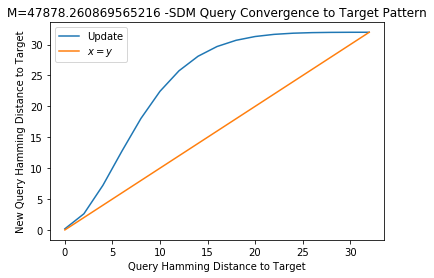

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


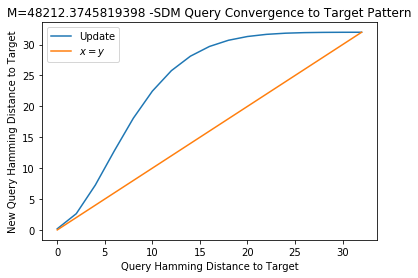

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


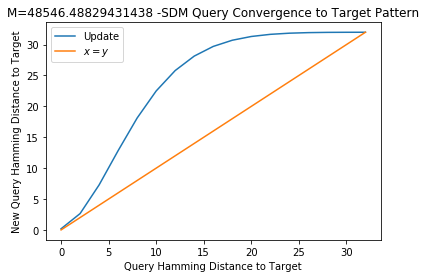

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


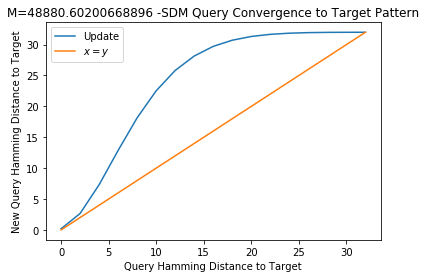

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


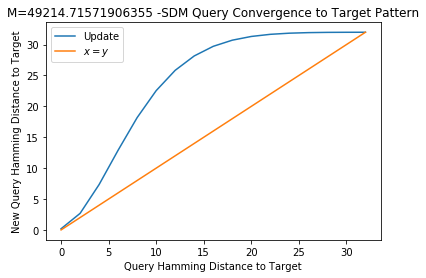

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


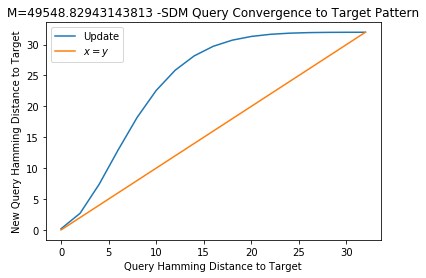

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


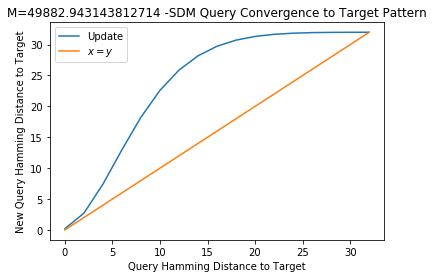

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


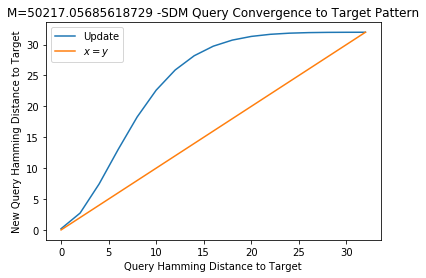

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


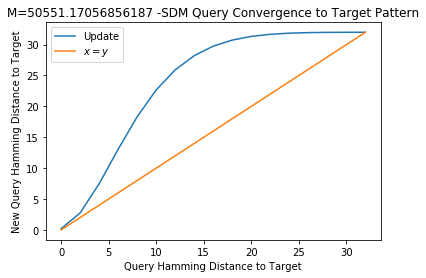

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


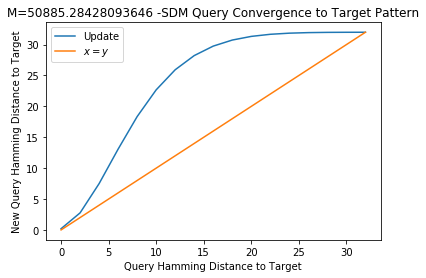

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


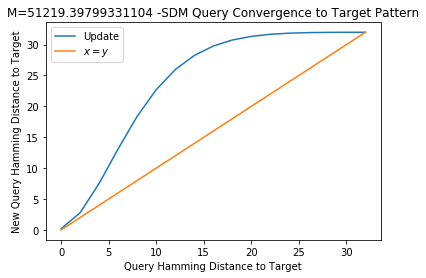

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


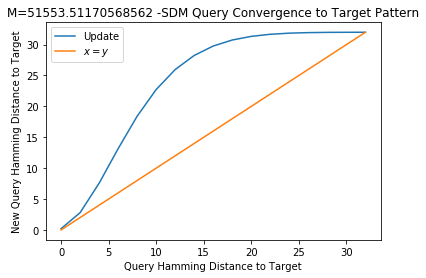

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


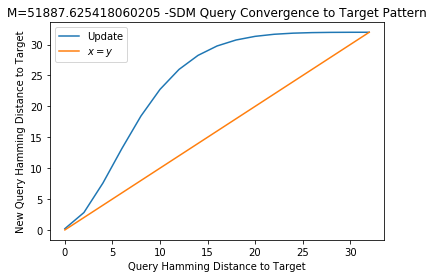

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


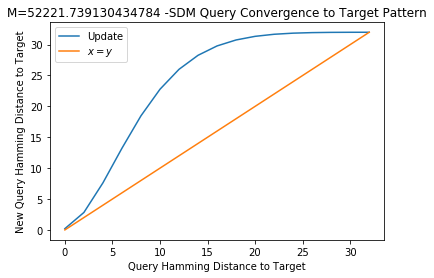

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


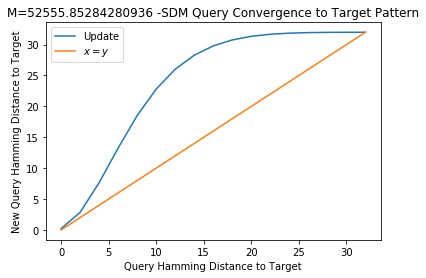

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


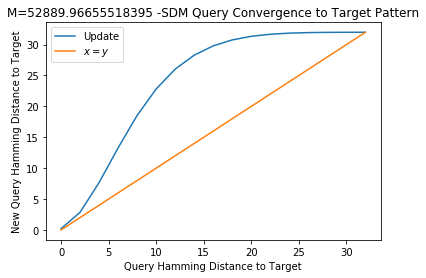

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


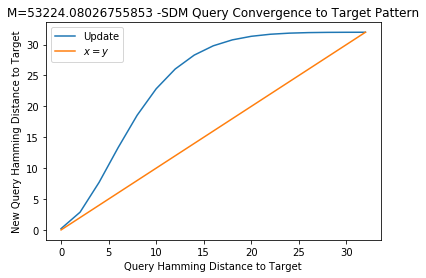

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


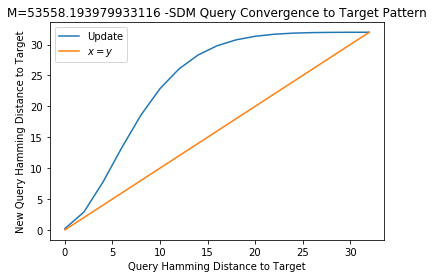

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


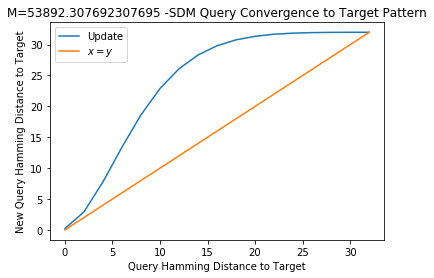

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


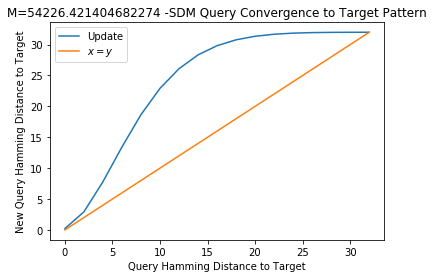

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


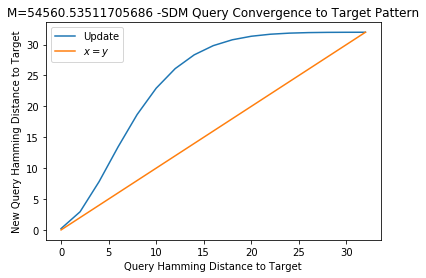

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


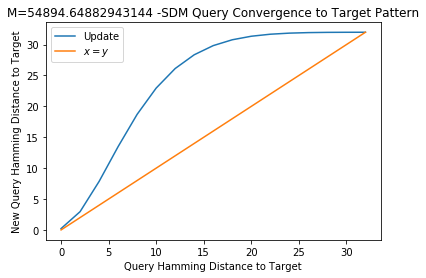

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


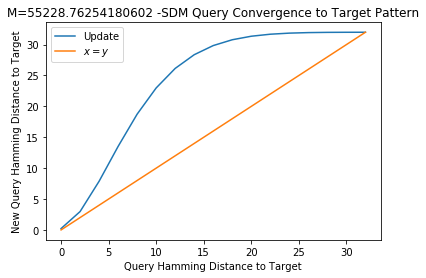

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


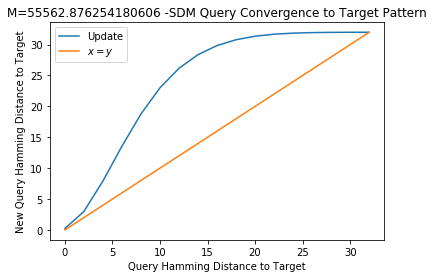

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


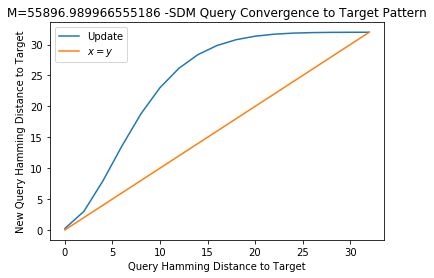

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


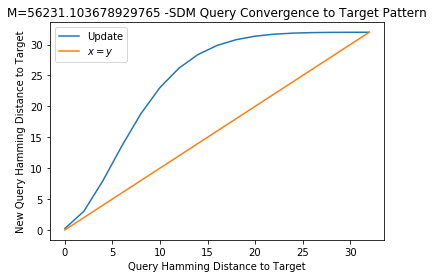

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


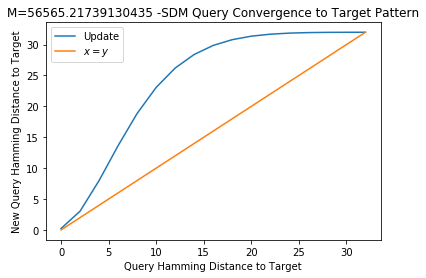

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


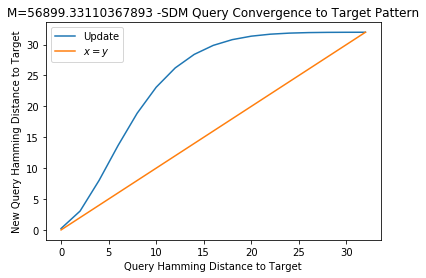

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


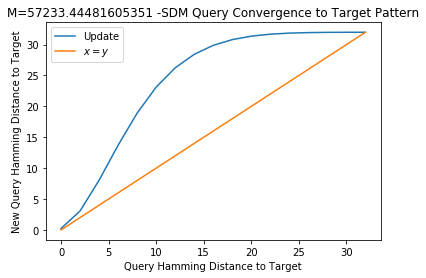

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


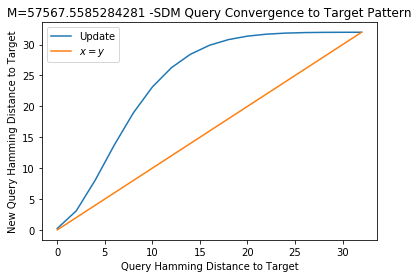

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


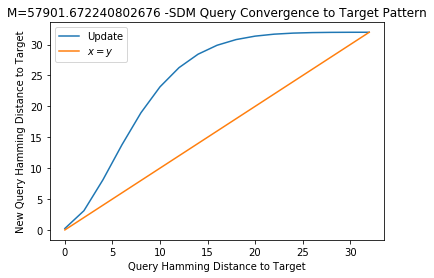

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


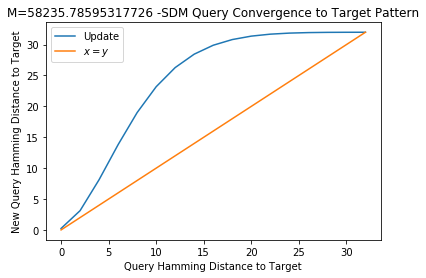

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


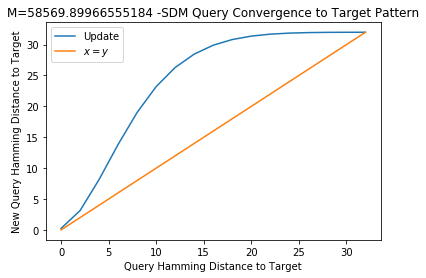

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


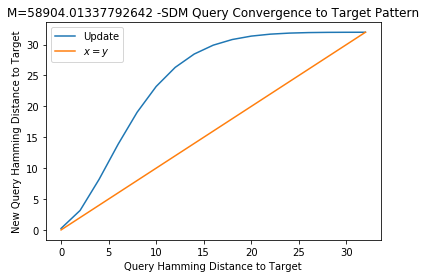

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


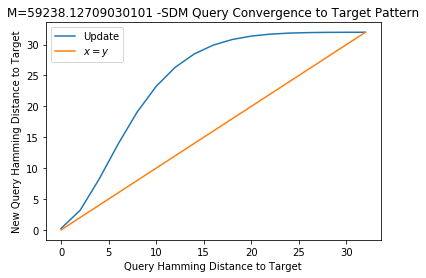

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


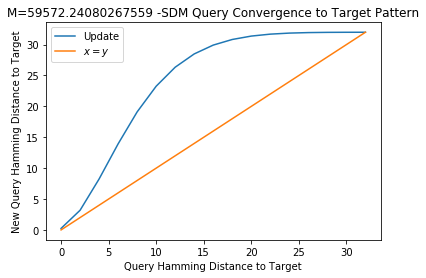

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


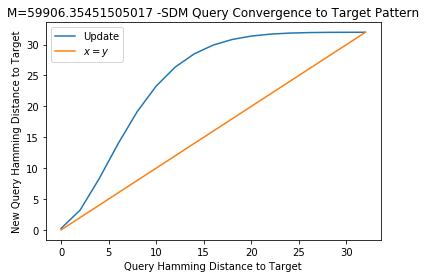

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


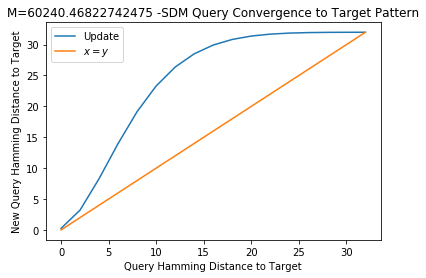

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


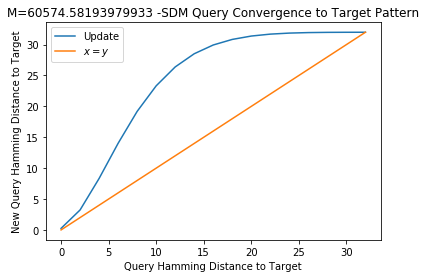

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


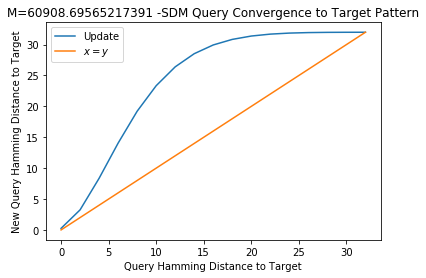

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


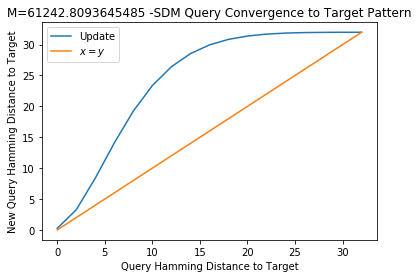

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


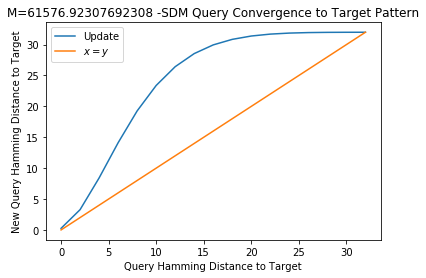

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


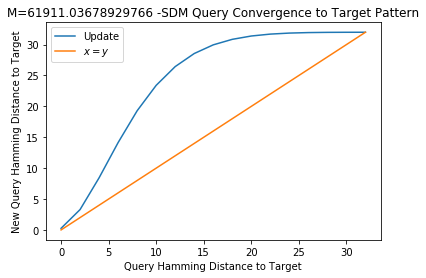

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


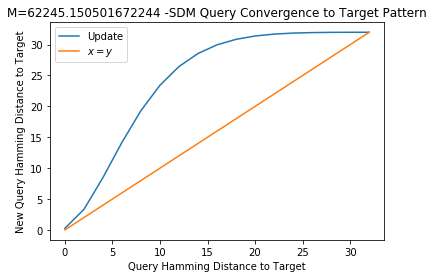

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


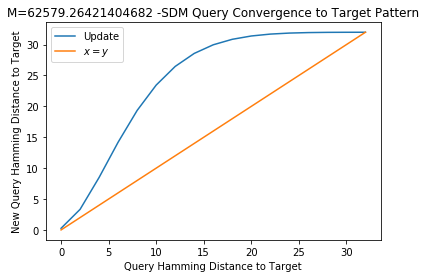

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


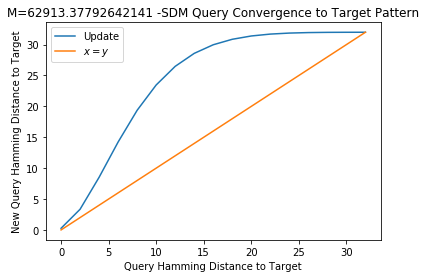

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


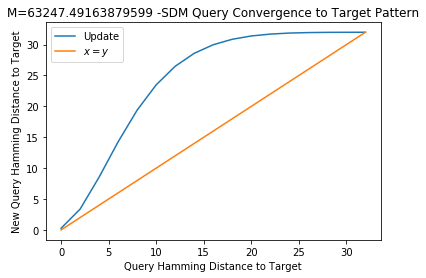

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


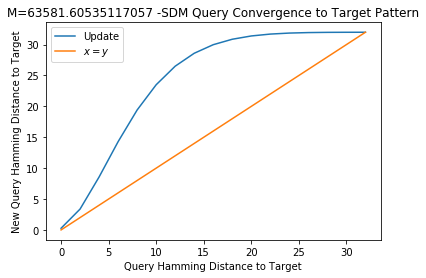

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


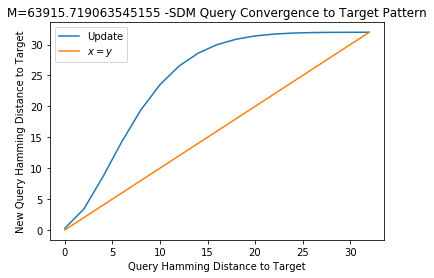

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


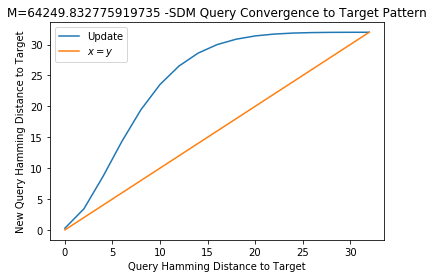

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


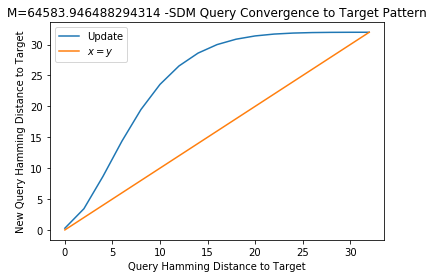

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


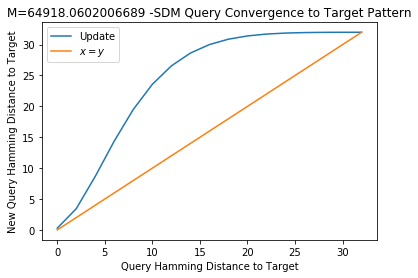

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


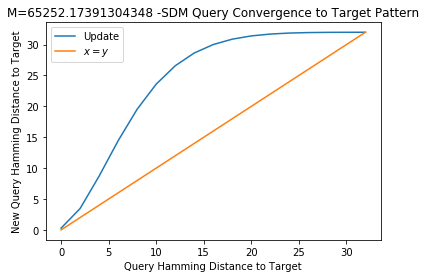

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


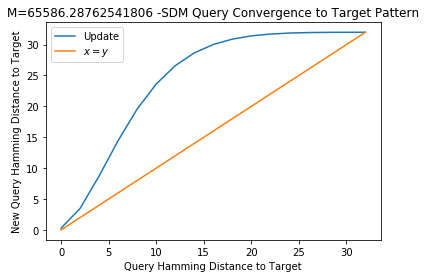

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


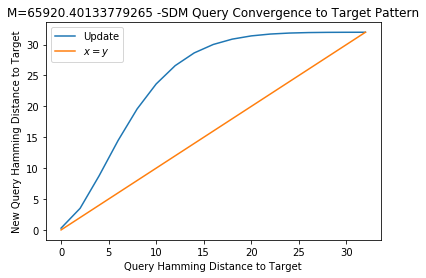

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


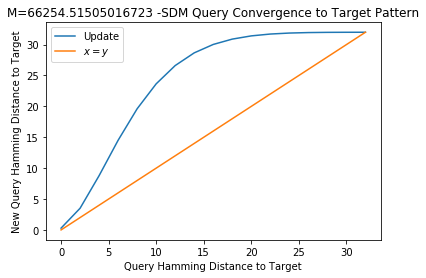

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


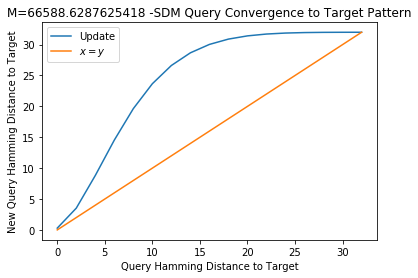

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


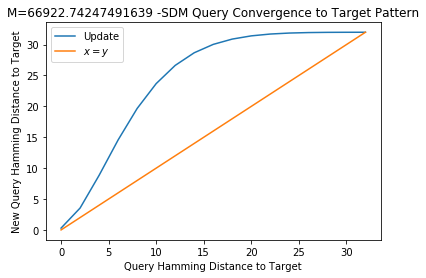

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


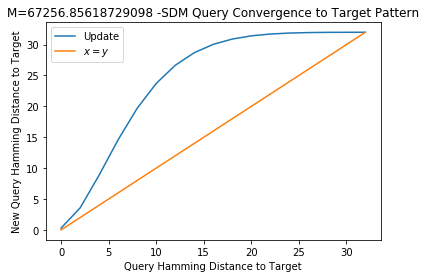

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


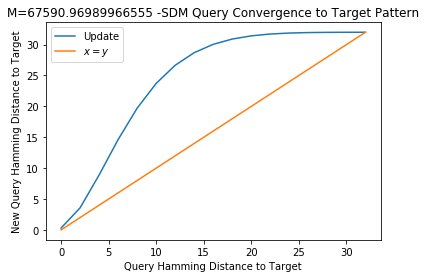

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


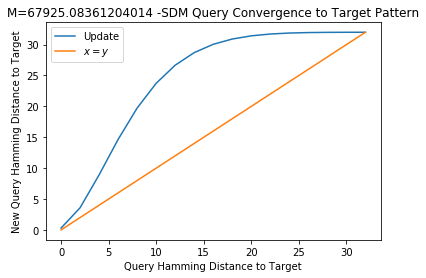

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


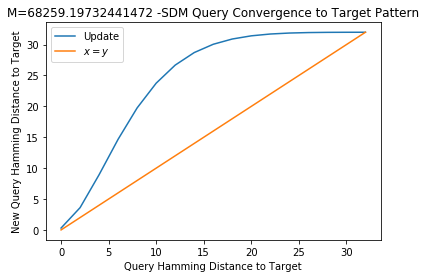

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


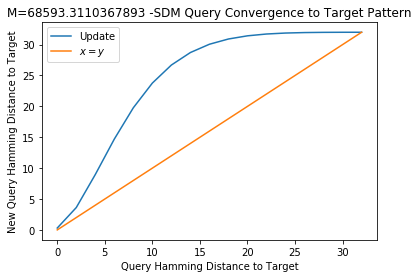

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


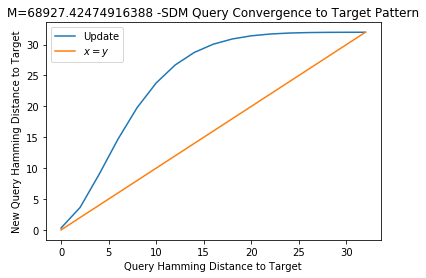

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


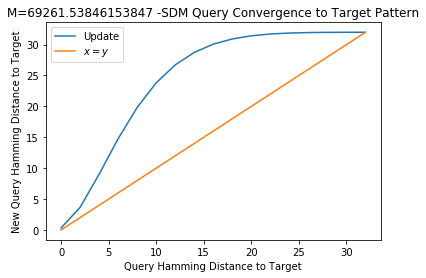

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


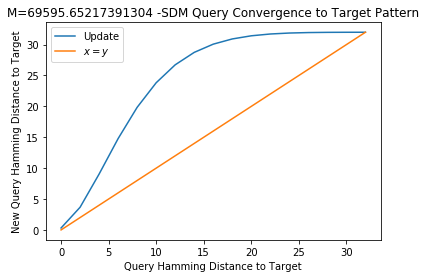

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


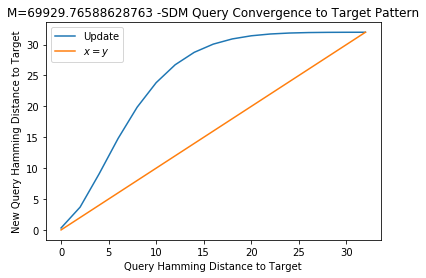

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


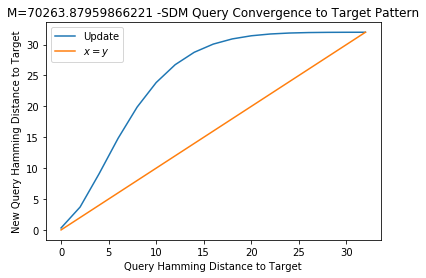

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


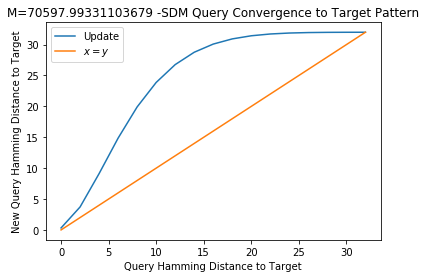

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


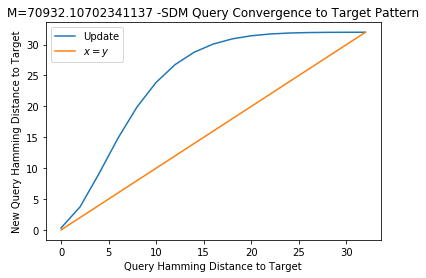

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


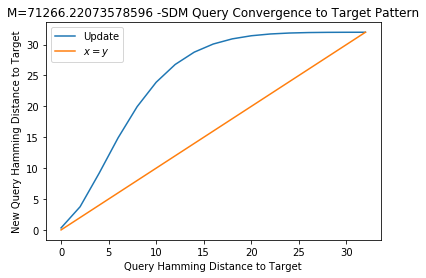

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


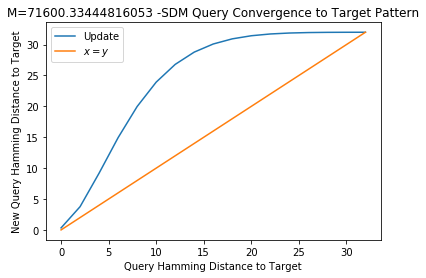

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


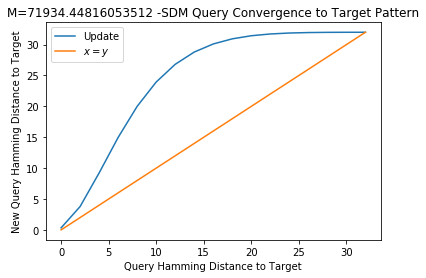

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


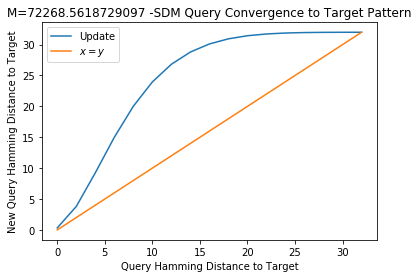

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


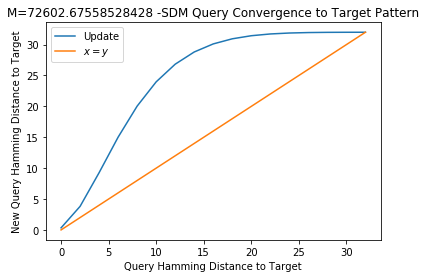

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


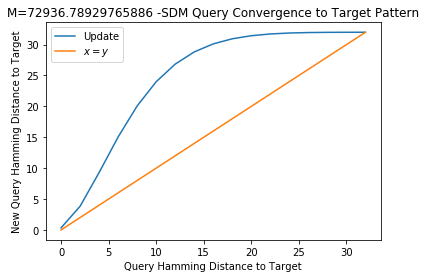

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


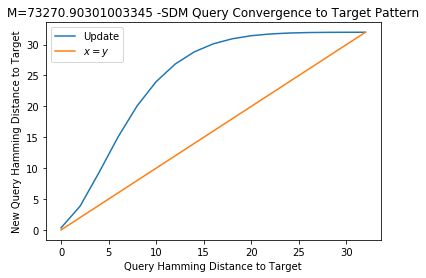

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


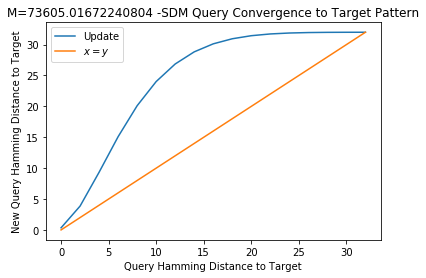

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


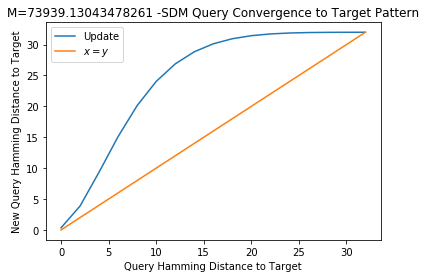

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


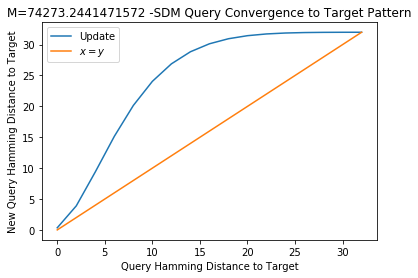

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


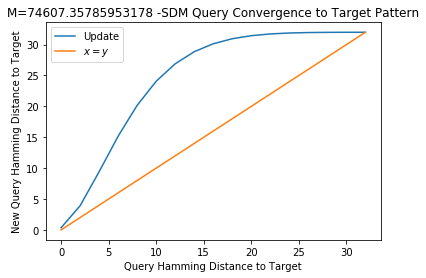

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


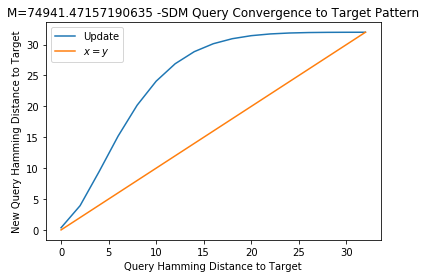

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


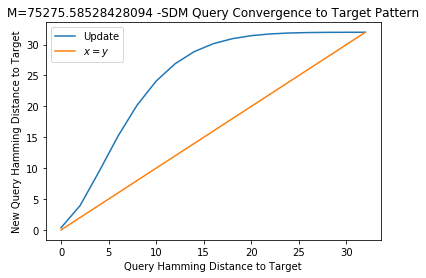

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


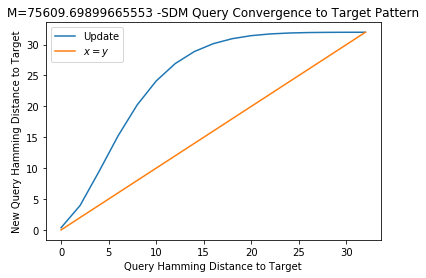

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


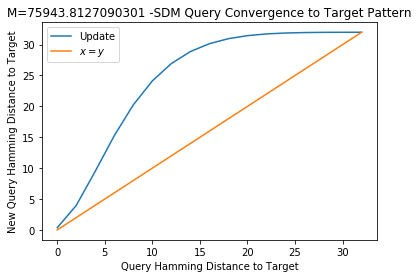

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


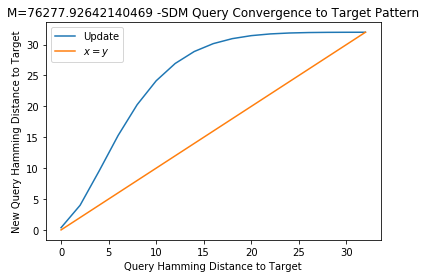

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


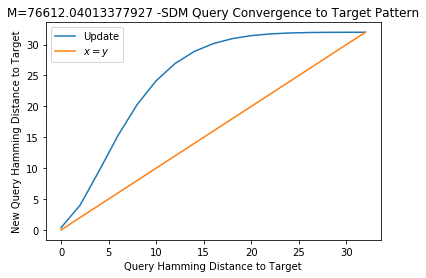

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


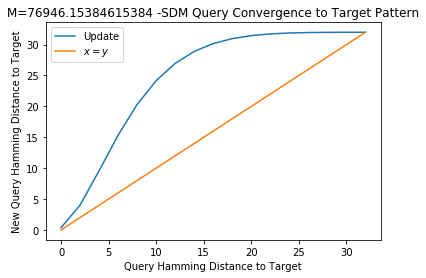

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


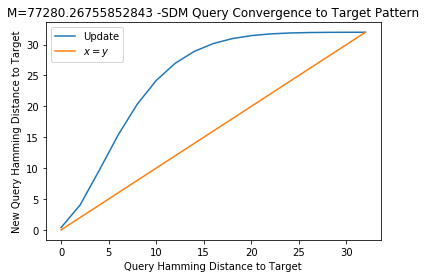

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


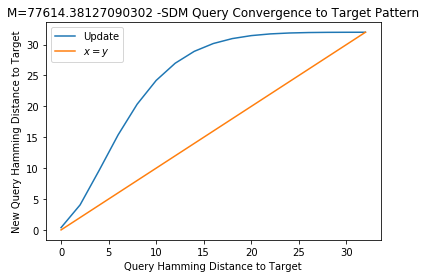

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


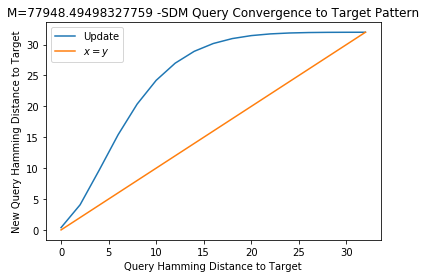

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


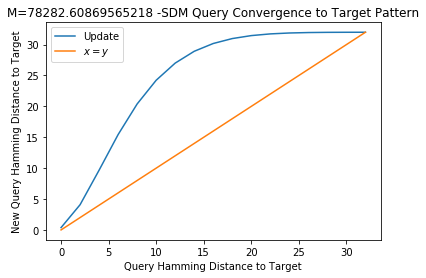

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


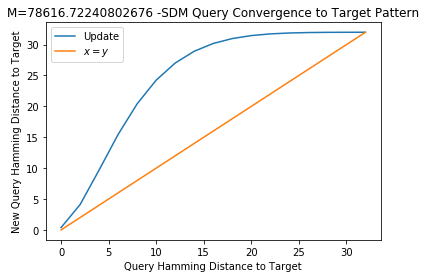

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


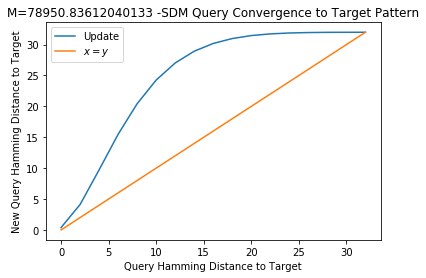

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


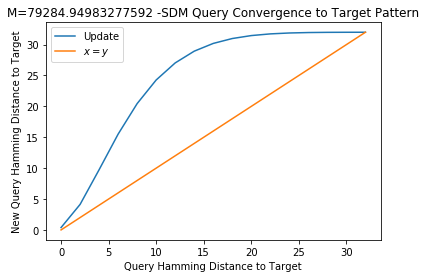

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


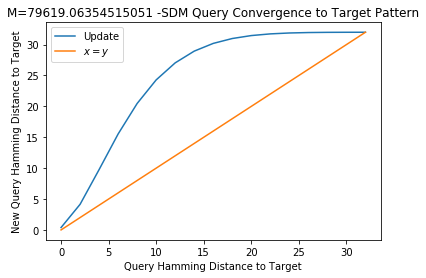

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


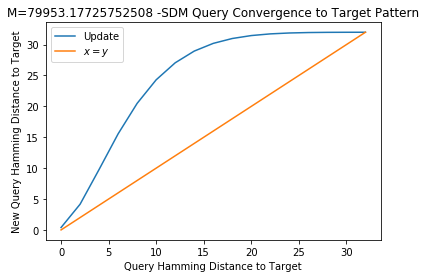

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


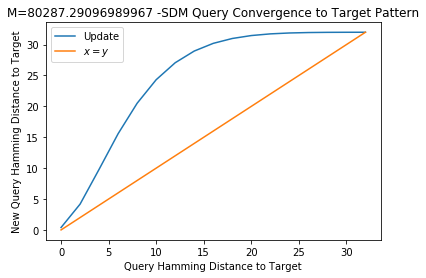

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


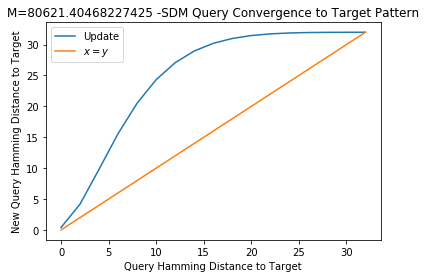

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


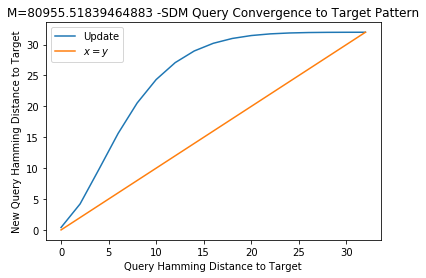

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


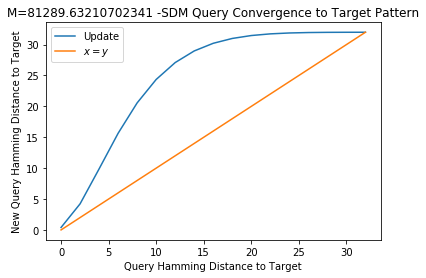

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


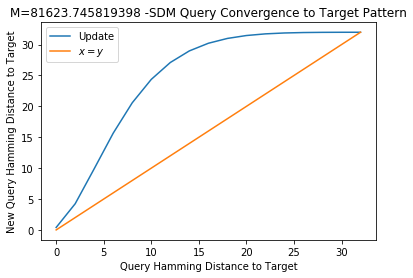

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


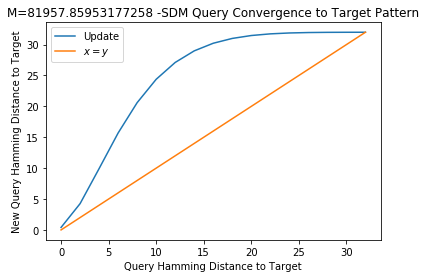

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


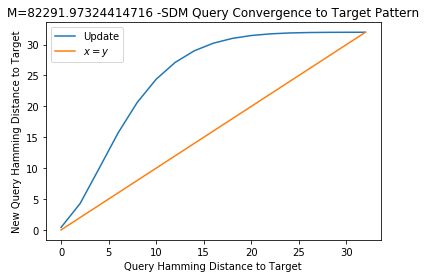

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


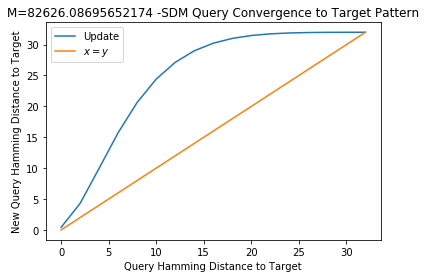

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


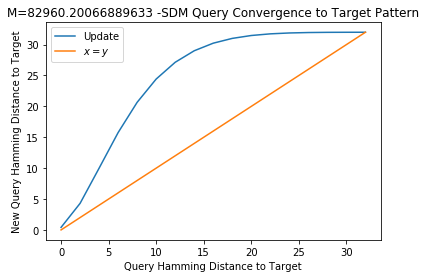

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


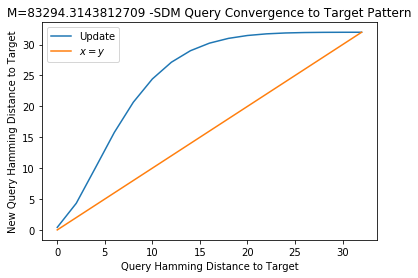

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


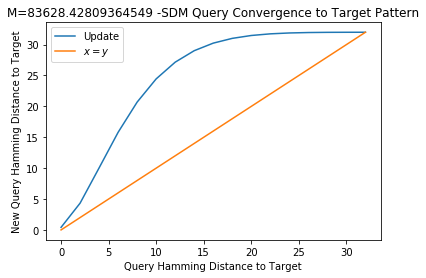

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


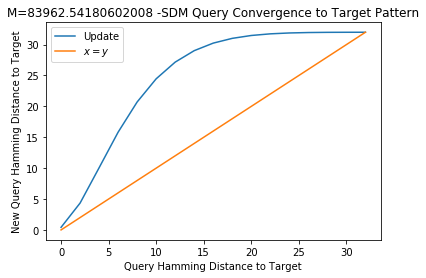

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


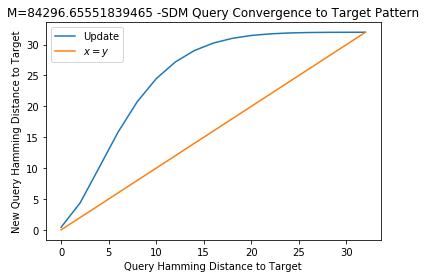

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


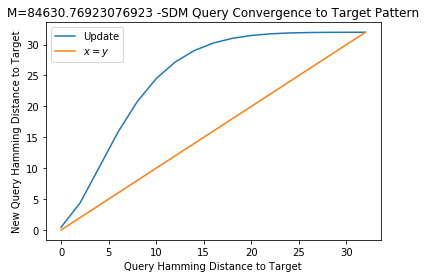

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


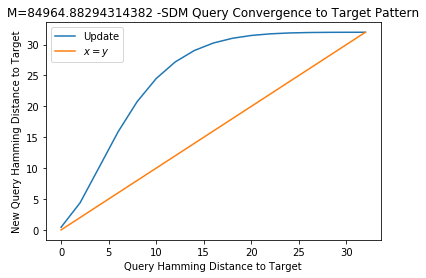

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


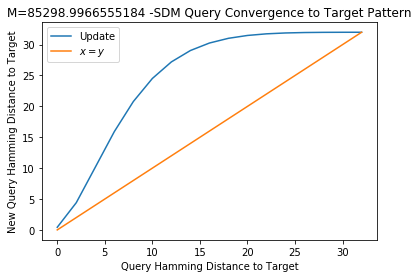

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


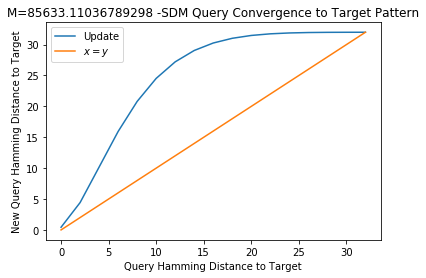

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


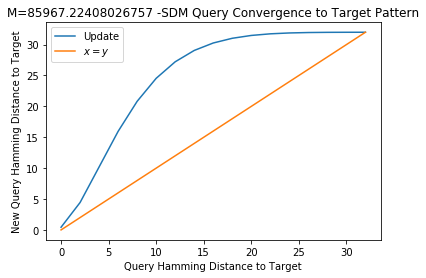

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


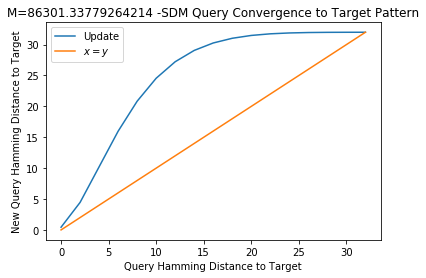

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


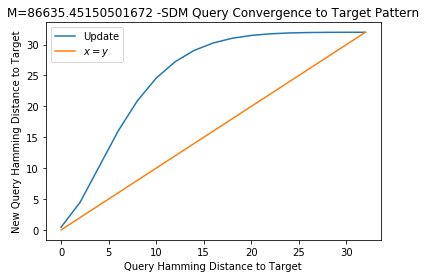

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


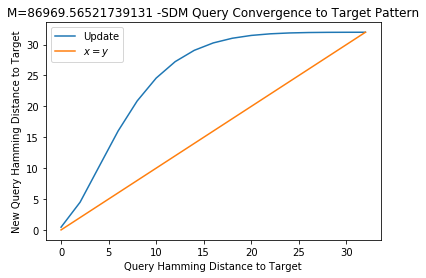

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


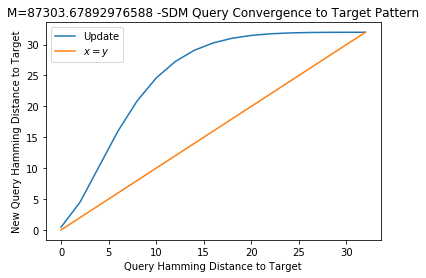

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


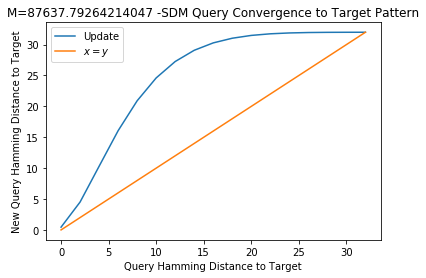

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


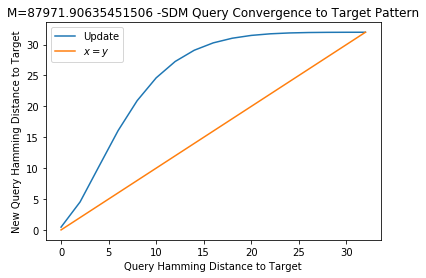

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


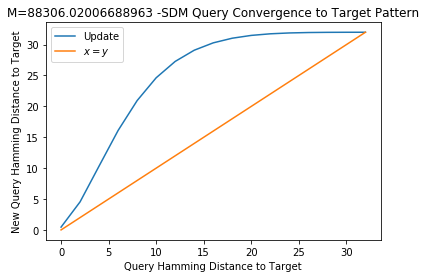

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


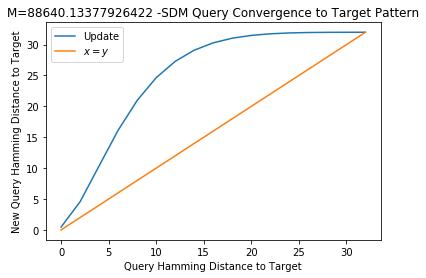

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


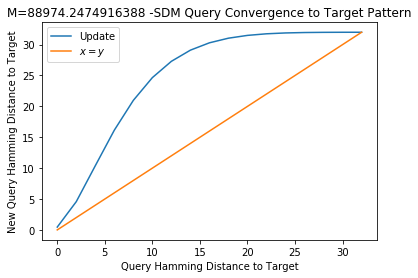

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


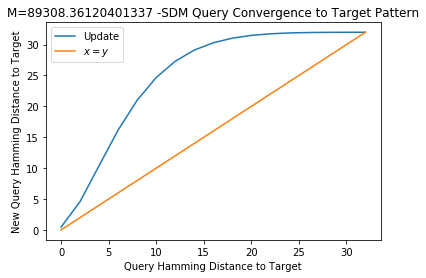

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


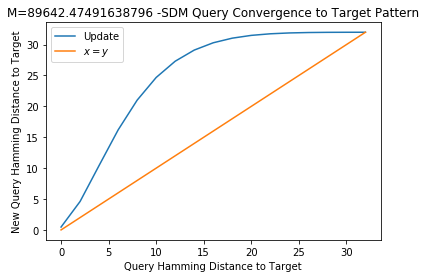

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


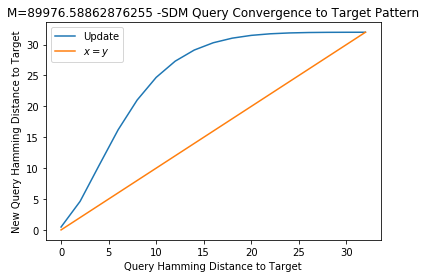

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


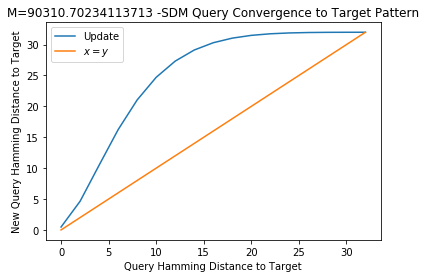

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


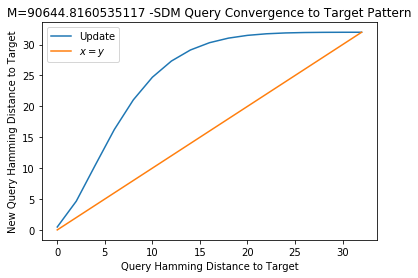

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


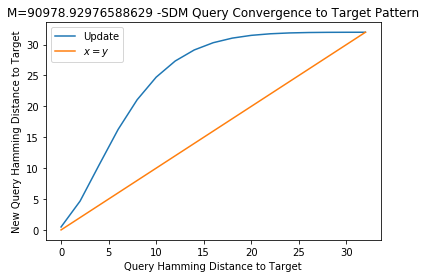

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


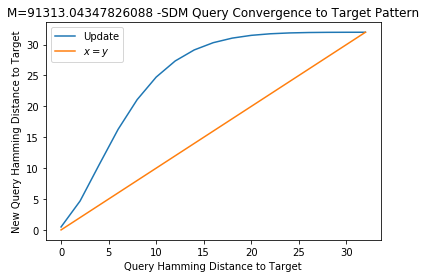

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


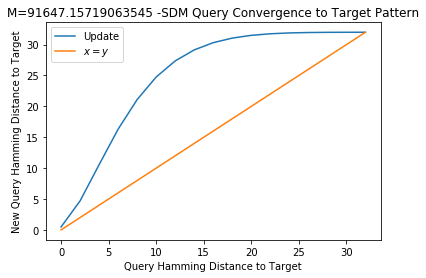

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


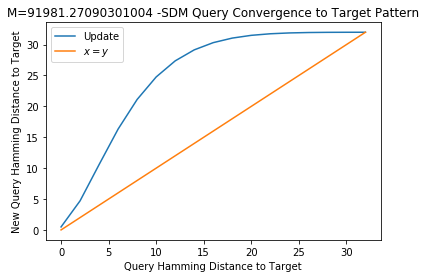

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


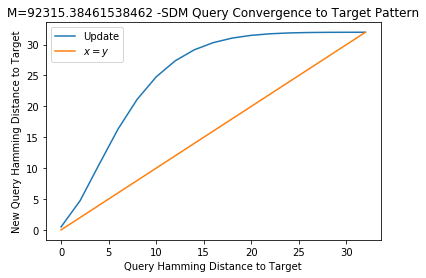

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


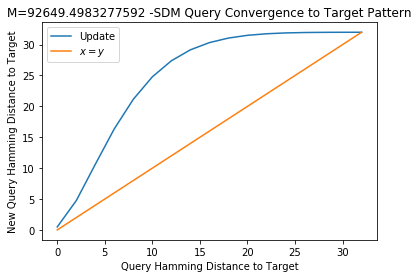

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


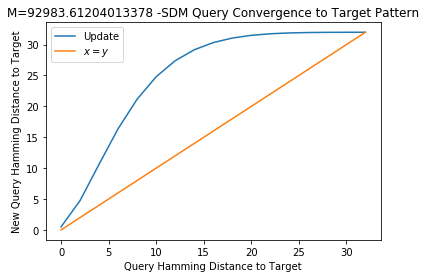

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


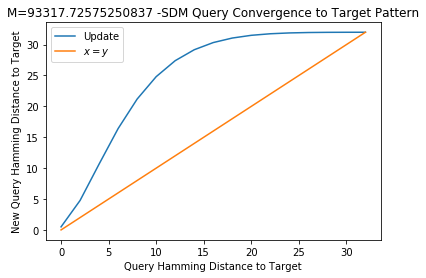

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


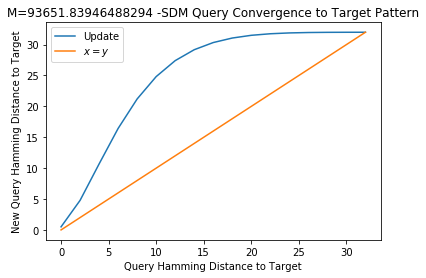

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


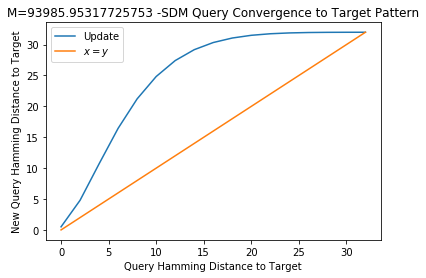

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


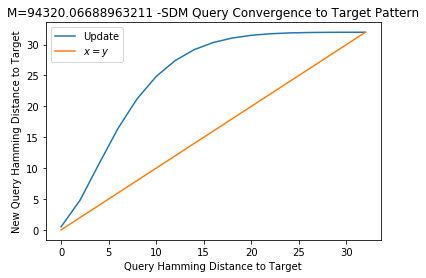

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


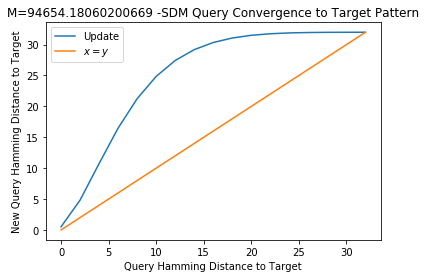

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


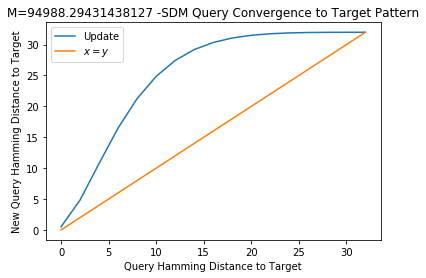

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


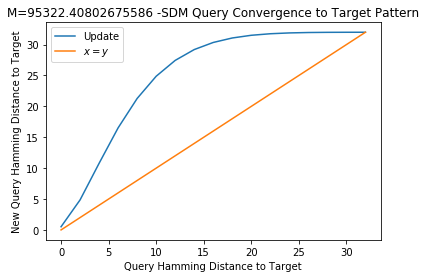

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


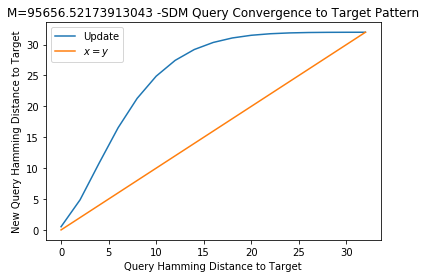

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


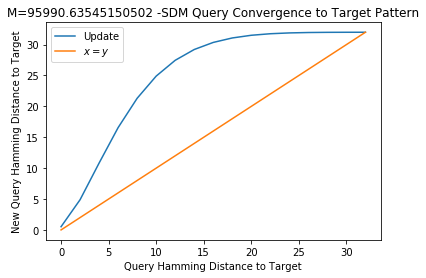

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


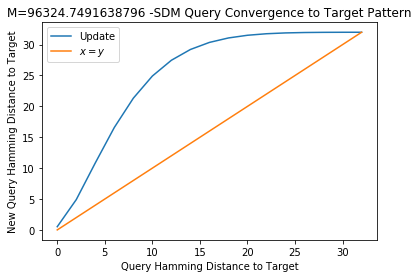

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


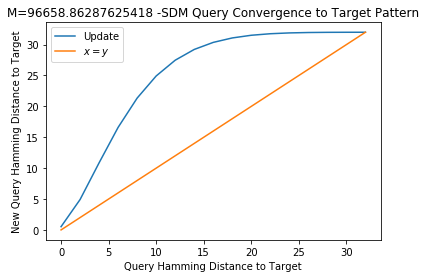

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


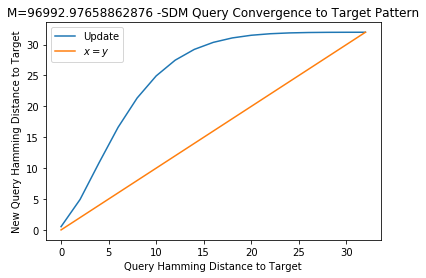

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


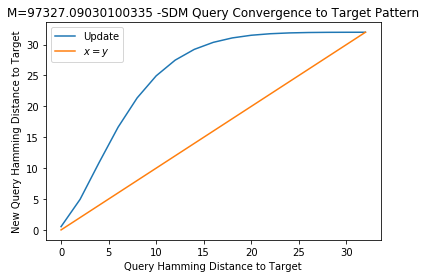

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


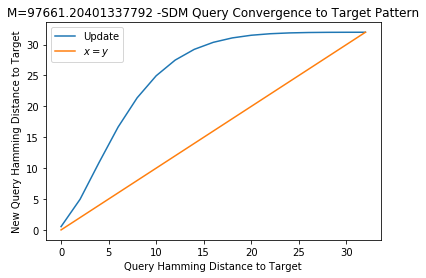

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


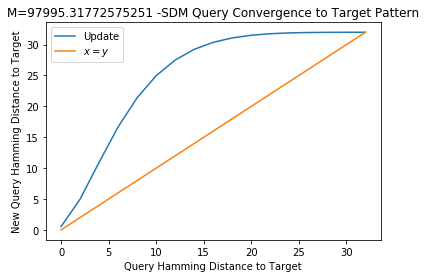

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


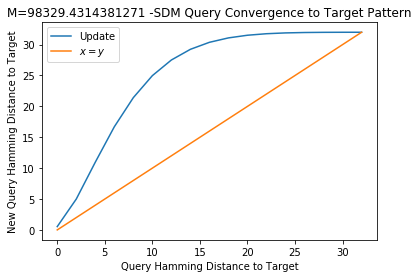

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


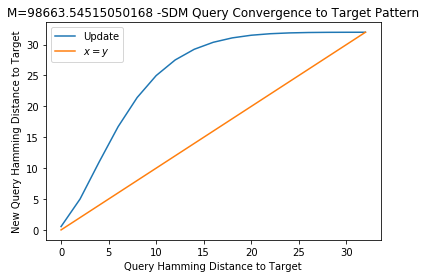

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


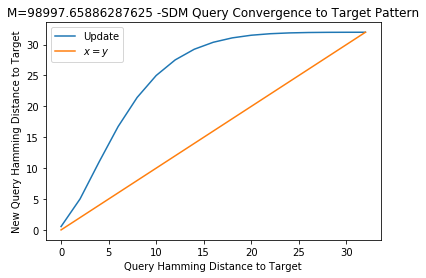

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


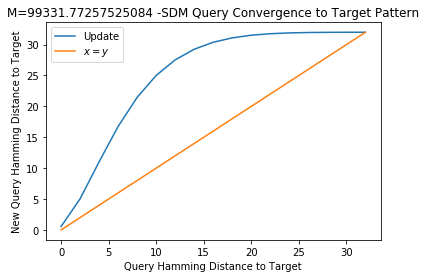

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


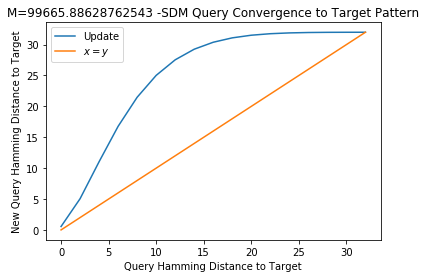

crit_dist= 0
critical distance plot curves wrong way thus crit dist = 0


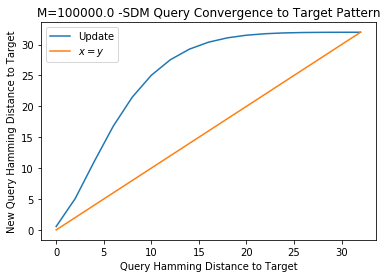

crit_dist= 0


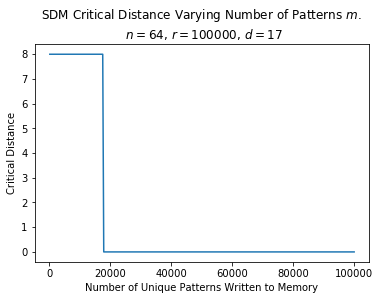

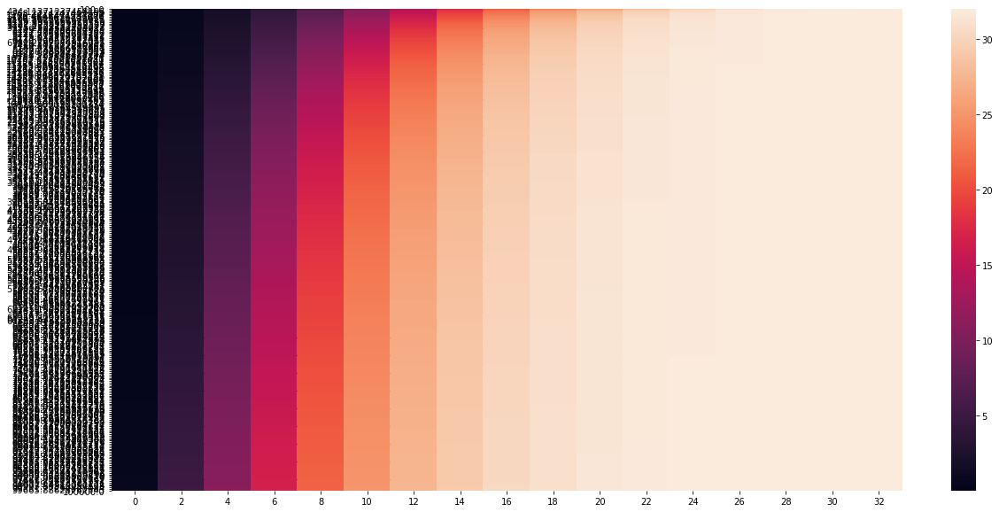

In [13]:


hamm_dist = 17 # hamming dist
n=64 # dimensions
r = 100000 # number of neurons
#m = 10000 # number of patterns

drang_interval = 2

ploteach = True

heat = []
crit_dists = []
mrang = np.linspace(100,100000, 300 )
for m in mrang:
    bits_distances, crit_dist, dvals = compute_bitdist_critdist(n,hamm_dist,r,m,drang_interval)
    crit_dists.append(crit_dist)
    
    if ploteach: 
        plt.plot(dvals, bits_distances, label='Update')
        plt.plot(dvals, dvals, label='$x=y$')
        plt.legend()
        plt.xlabel("Query Hamming Distance to Target")
        plt.ylabel("New Query Hamming Distance to Target")
        plt.title("M="+str(m)+" -SDM Query Convergence to Target Pattern")
        
        #plt.gcf().savefig('figures/p_'+str(p)+'SDMNewQueryConvergence.png', dpi=250)
        plt.show()
        print('crit_dist=',crit_dist)
    heat.append(bits_distances)
    
plt.plot(mrang, crit_dists)
plt.xlabel("Number of Unique Patterns Written to Memory")
plt.ylabel("Critical Distance")
plt.title("SDM Critical Distance Varying Number of Patterns $m$. \n $n=$"+str(n)+", $r=$"+str(r)+", $d=$"+str(hamm_dist))
plt.gcf().savefig('figures/SDMCritDist_VaryM'+str(n)+'.png', dpi=250)
plt.show()
    
if ploteach: 
    heat = np.asarray(heat)
    fig, ax = plt.subplots(figsize=(20,10)) 
    sns.heatmap(heat,xticklabels=dvals, yticklabels = mrang )
    plt.show()

# Varying the number of dimensions n

critical distance plot curves wrong way thus crit dist = 0


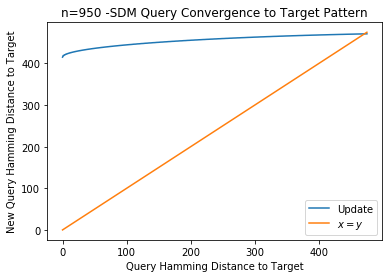

critical distance plot curves wrong way thus crit dist = 0


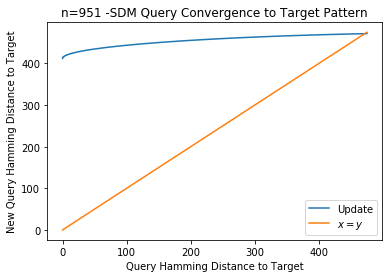

critical distance plot curves wrong way thus crit dist = 0


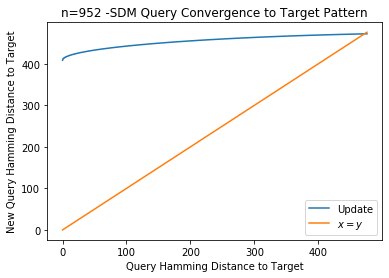

critical distance plot curves wrong way thus crit dist = 0


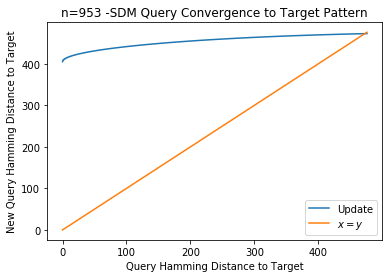

critical distance plot curves wrong way thus crit dist = 0


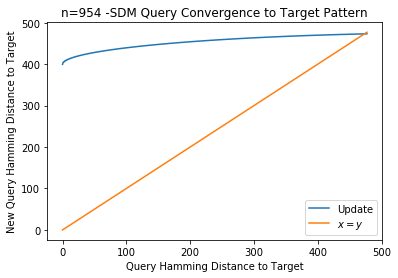

critical distance plot curves wrong way thus crit dist = 0


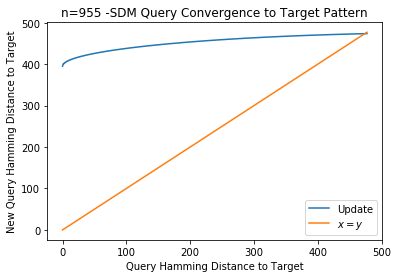

critical distance plot curves wrong way thus crit dist = 0


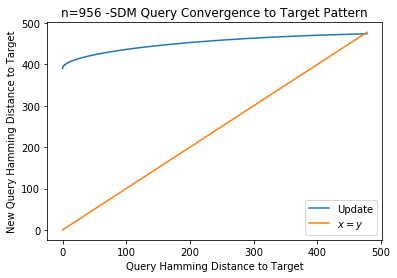

critical distance plot curves wrong way thus crit dist = 0


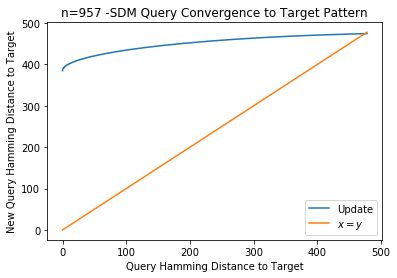

critical distance plot curves wrong way thus crit dist = 0


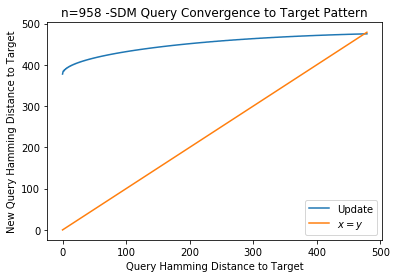

critical distance plot curves wrong way thus crit dist = 0


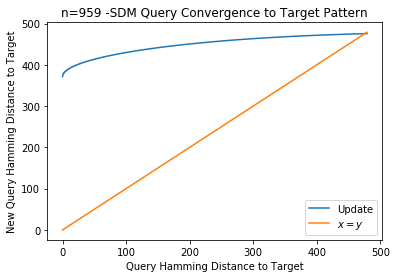

critical distance plot curves wrong way thus crit dist = 0


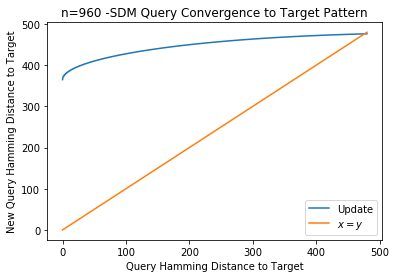

critical distance plot curves wrong way thus crit dist = 0


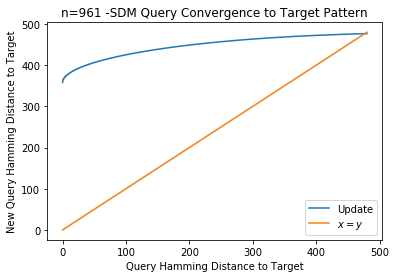

critical distance plot curves wrong way thus crit dist = 0


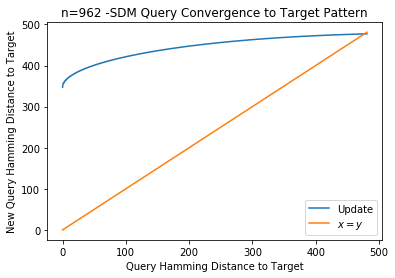

critical distance plot curves wrong way thus crit dist = 0


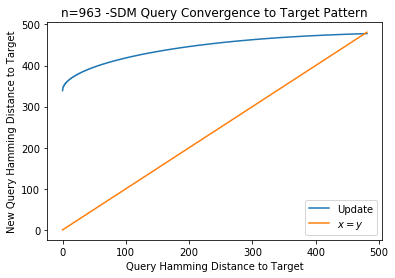

critical distance plot curves wrong way thus crit dist = 0


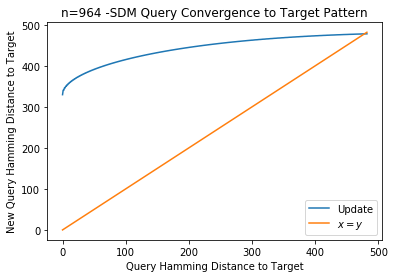

critical distance plot curves wrong way thus crit dist = 0


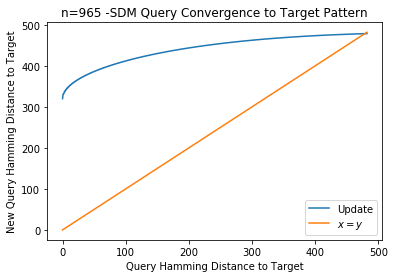

critical distance plot curves wrong way thus crit dist = 0


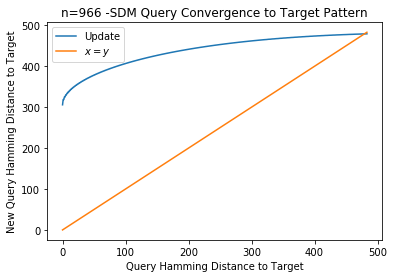

critical distance plot curves wrong way thus crit dist = 0


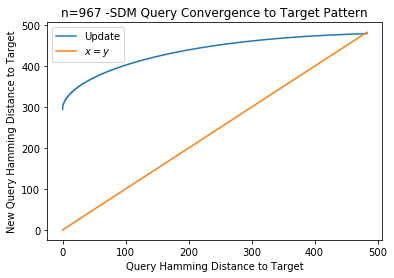

critical distance plot curves wrong way thus crit dist = 0


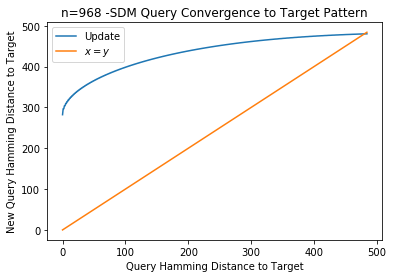

critical distance plot curves wrong way thus crit dist = 0


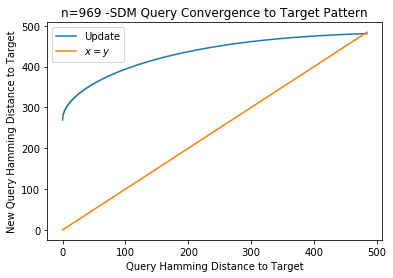

critical distance plot curves wrong way thus crit dist = 0


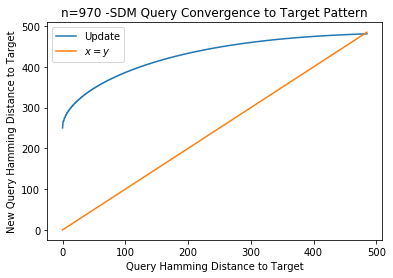

critical distance plot curves wrong way thus crit dist = 0


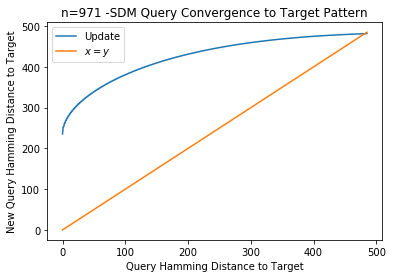

critical distance plot curves wrong way thus crit dist = 0


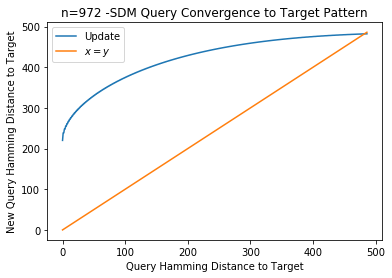

critical distance plot curves wrong way thus crit dist = 0


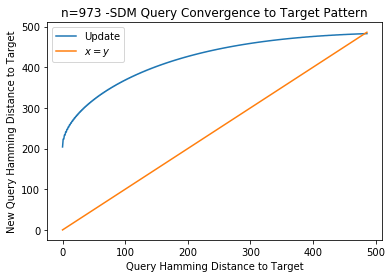

critical distance plot curves wrong way thus crit dist = 0


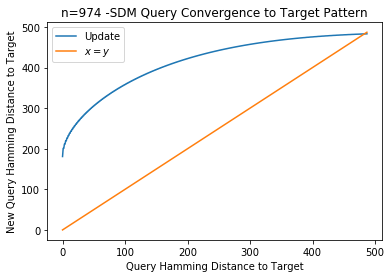

critical distance plot curves wrong way thus crit dist = 0


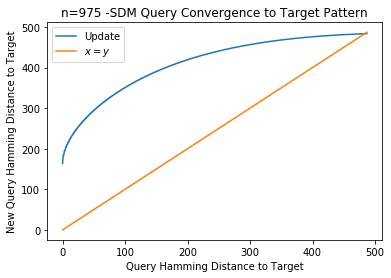

critical distance plot curves wrong way thus crit dist = 0


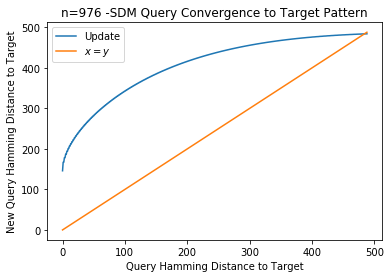

critical distance plot curves wrong way thus crit dist = 0


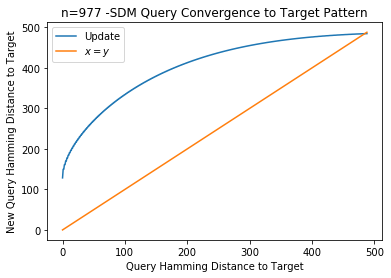

critical distance plot curves wrong way thus crit dist = 0


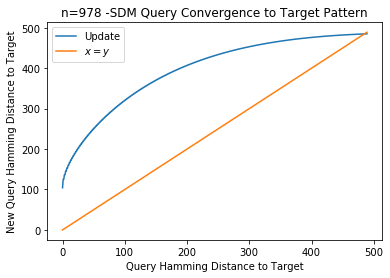

critical distance plot curves wrong way thus crit dist = 0


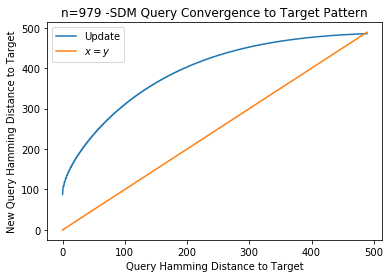

critical distance plot curves wrong way thus crit dist = 0


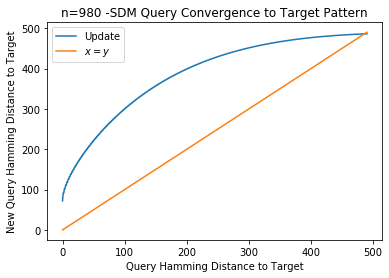

critical distance plot curves wrong way thus crit dist = 0


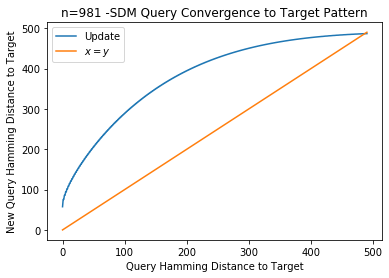

critical distance plot curves wrong way thus crit dist = 0


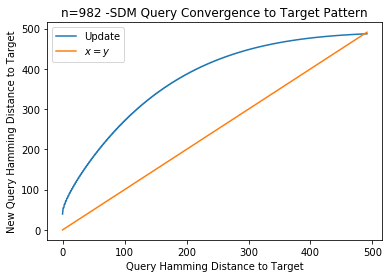

critical distance plot curves wrong way thus crit dist = 0


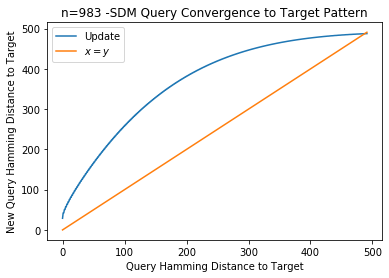

critical distance plot curves wrong way thus crit dist = 0


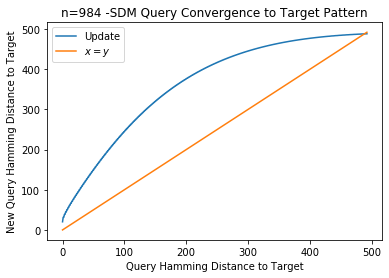

critical distance plot curves wrong way thus crit dist = 0


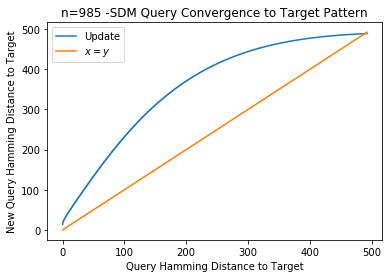

critical distance plot curves wrong way thus crit dist = 0


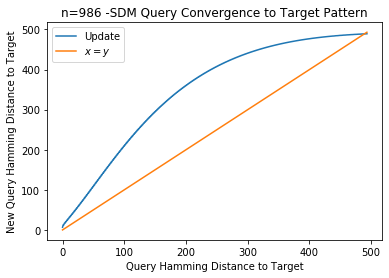

critical distance plot curves wrong way thus crit dist = 0


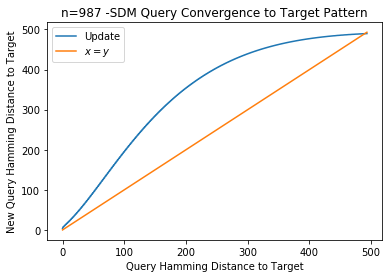

critical distance plot curves wrong way thus crit dist = 0


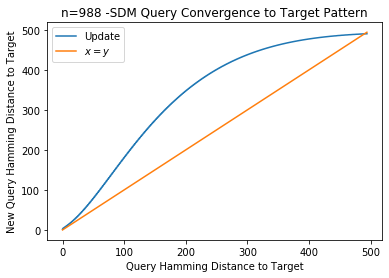

critical distance plot curves wrong way thus crit dist = 0


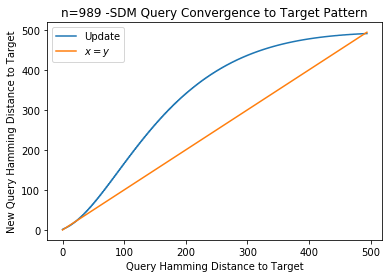

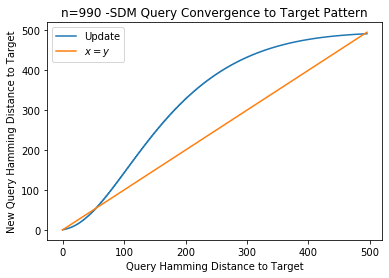

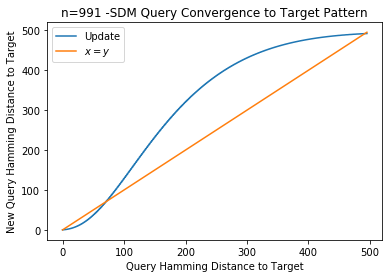

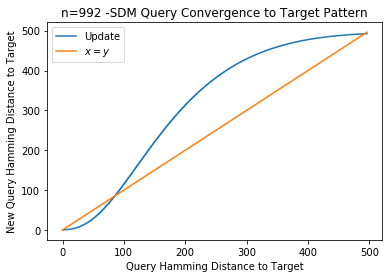

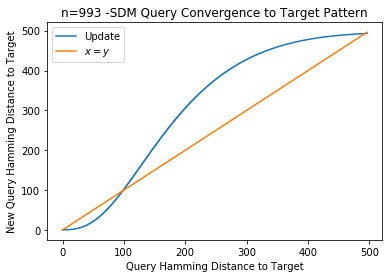

...

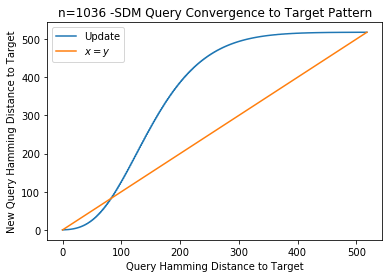

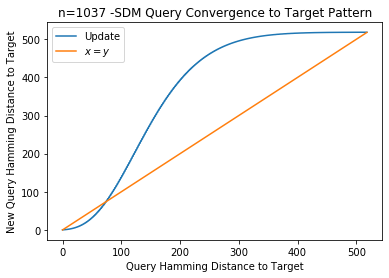

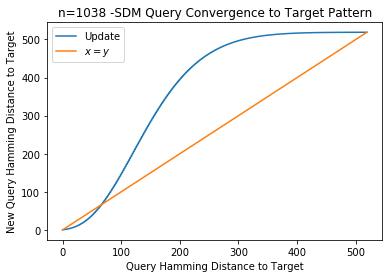

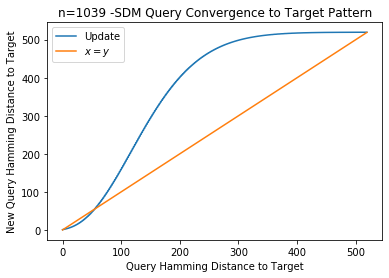

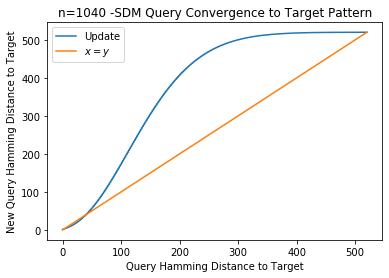

/Users/trentonbricken/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in less
/Users/trentonbricken/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in greater


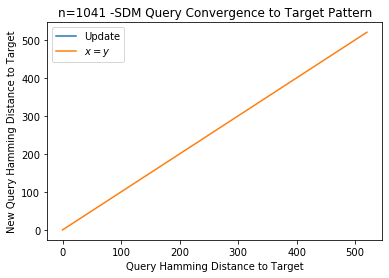

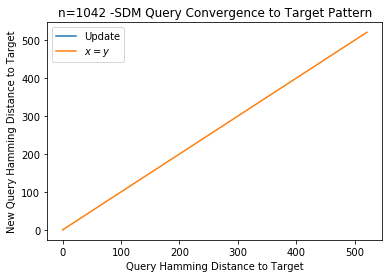

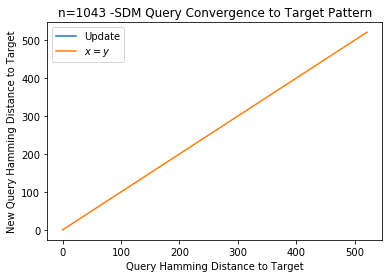

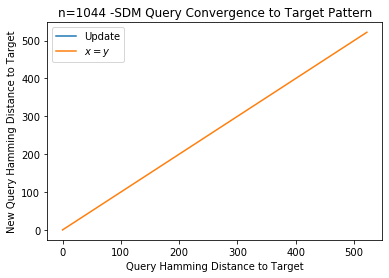

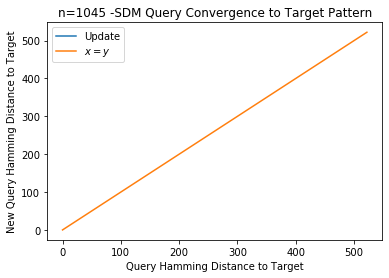

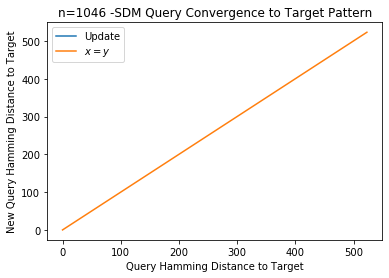

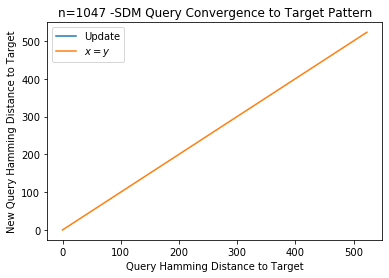

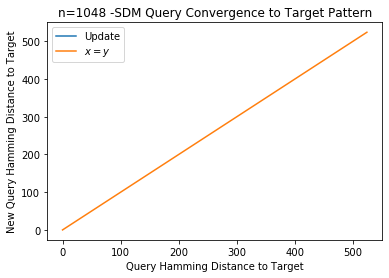

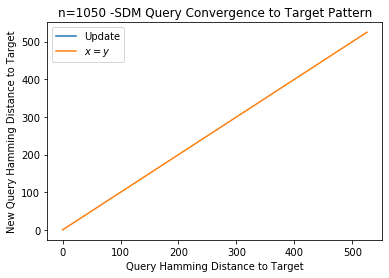

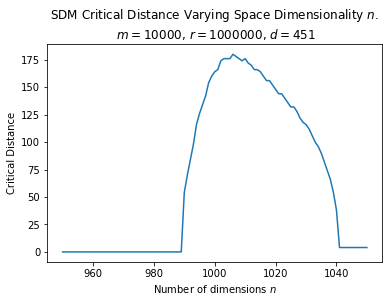

In [13]:

hamm_dist = 451 # hamming dist
#n=1000 # dimensions
r = 1000000 # number of neurons
m = 10000 # number of patterns

drang_interval = 1
ploteach = True

heat = []
crit_dists = []
nrang = np.linspace(950,1050,100 ).astype(int) #[950, 1040]#np.linspace(950,1200,10 ).astype(int) # np.arange(900,2200 )
for n in nrang:
    n = int(n)
    
    bits_distances, crit_dist, dvals = compute_bitdist_critdist(n,hamm_dist,r,m,drang_interval)
    
    crit_dists.append(crit_dist)
    
    if ploteach: 
        plt.plot(dvals, bits_distances, label='Update')
        plt.plot(dvals, dvals, label='$x=y$')
        plt.legend()
        plt.xlabel("Query Hamming Distance to Target")
        plt.ylabel("New Query Hamming Distance to Target")
        plt.title("n="+str(n)+" -SDM Query Convergence to Target Pattern")

        #plt.gcf().savefig('figures/p_'+str(p)+'SDMNewQueryConvergence.png', dpi=250)
        plt.show()

    heat.append(bits_distances)
    
plt.plot(nrang, crit_dists)
plt.xlabel("Number of dimensions $n$")
plt.ylabel("Critical Distance")
plt.title("SDM Critical Distance Varying Space Dimensionality $n$. \n $m=$"+str(m)+", $r=$"+str(r)+", $d=$"+str(hamm_dist))
plt.gcf().savefig('figures/SDMCritDist_VaryN'+str(n)+'.png', dpi=250)
plt.show()

# Varying the Hamming distance d

critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist =

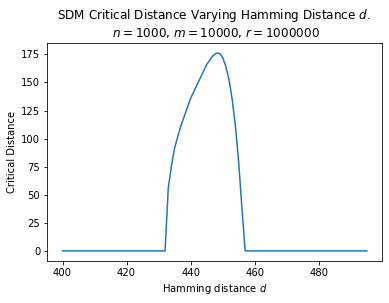

In [43]:

#hamm_dist = 451 # hamming dist
n=1000 # dimensions
r = 1000000 # number of neurons
m = 10000 # number of patterns

drang_interval = 1

ploteach = False

heat = []
crit_dists = []
if n==64:
    hamm_distances = np.linspace(9,25, 16 ).astype(int)
elif n==1000:
    hamm_distances = np.linspace(400,495, 95 ).astype(int)  #np.linspace(50,495, 10 ) # #np.linspace(100,495, 10 )
else: 
    raise Exception("Need to program in hamming distances")
for hamm_dist in hamm_distances:
    hamm_dist = int(hamm_dist)
    
    bits_distances, crit_dist, dvals = compute_bitdist_critdist(n,hamm_dist,r,m,drang_interval,
                                                               print_things =False)
        
    crit_dists.append(crit_dist)
    
    if ploteach: 
        plt.plot(dvals, bits_distances, label='Update')
        plt.plot(dvals, dvals, label='$x=y$')
        plt.legend()
        plt.xlabel("Query Hamming Distance to Target")
        plt.ylabel("New Query Hamming Distance to Target")
        plt.title("hamm_dist="+str(hamm_dist)+" -SDM Query Convergence to Target Pattern")

        #plt.gcf().savefig('figures/p_'+str(p)+'SDMNewQueryConvergence.png', dpi=250)
        plt.show()

    heat.append(bits_distances)
    
plt.plot(hamm_distances, crit_dists)
print(hamm_distances)
print(crit_dists)
print(hamm_distances[np.argmax(crit_dists)])
plt.xlabel("Hamming distance $d$")
plt.ylabel("Critical Distance")
#plt.axvline(447)
plt.title("SDM Critical Distance Varying Hamming Distance $d$. \n $n=$"+str(n)+", $m=$"+str(m)+", $r=$"+str(r)) # 2^n
plt.gcf().savefig('figures/SDMCritDist_VaryD_N='+str(n)+'M='+str(m)+'.png', dpi=250)
plt.show()

/Users/trentonbricken/SDM/SDM_Circ_Inter_Funcs.py:101: RuntimeWarning: divide by zero encountered in log
  expected_intersect = np.log(intersect)+np.log(perc_addresses_w_neurons)
/Users/trentonbricken/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.


critical distance plot curves wrong way thus crit dist = 0
[ 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 25]
[19, 21, 23, 25, 27, 29, 31, 32, 32, 32, 32, 32, 32, 32, 24, 0]
16
critical distance plot curves wrong way thus crit dist = 0
[ 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 25]
[19, 21, 23, 25, 27, 29, 31, 32, 32, 32, 32, 32, 28, 22, 14, 0]
16
critical distance plot curves wrong way thus crit dist = 0
[ 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 25]
[19, 21, 23, 25, 27, 29, 31, 32, 32, 32, 28, 26, 22, 16, 4, 0]
16
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
[ 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 25]
[19, 21, 23, 25, 27, 29, 31, 30, 30, 28, 26, 24, 20, 12, 0, 0]
15


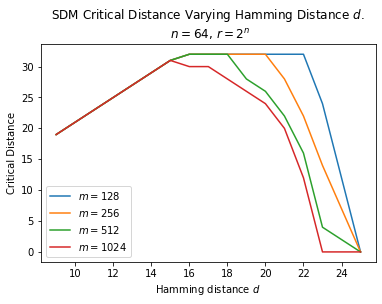

In [44]:
# doing plots for lots of different m values: 



#hamm_dist = 451 # hamming dist
n=64 # dimensions
r = 2**n # number of neurons
mvals = [128, 256, 512, 1024] # number of patterns

drang_interval = 1
ploteach = False

for m in mvals: 
    heat = []
    crit_dists = []
    if n==64:
        hamm_distances = np.linspace(9,25, 16 ).astype(int)
    elif n==1000:
        hamm_distances = np.linspace(400,495, 95 ).astype(int)  #np.linspace(50,495, 10 ) # #np.linspace(100,495, 10 )
    else: 
        raise Exception("Need to program in hamming distances")
    for hamm_dist in hamm_distances:
        hamm_dist = int(hamm_dist)

        bits_distances, crit_dist, dvals = compute_bitdist_critdist(n,hamm_dist,r,m,drang_interval,
                                                                   print_things =False)

        crit_dists.append(crit_dist)

        if ploteach: 
            plt.plot(dvals, bits_distances, label='Update')
            plt.plot(dvals, dvals, label='$x=y$')
            plt.legend()
            plt.xlabel("Query Hamming Distance to Target")
            plt.ylabel("New Query Hamming Distance to Target")
            plt.title("hamm_dist="+str(hamm_dist)+" -SDM Query Convergence to Target Pattern")

            #plt.gcf().savefig('figures/p_'+str(p)+'SDMNewQueryConvergence.png', dpi=250)
            plt.show()

        heat.append(bits_distances)

    plt.plot(hamm_distances, crit_dists, label="$m=$"+str(m))
    print(hamm_distances)
    print(crit_dists)
    print(hamm_distances[np.argmax(crit_dists)])
plt.xlabel("Hamming distance $d$")
plt.ylabel("Critical Distance")
plt.legend()
#plt.axvline(447)
plt.title("SDM Critical Distance Varying Hamming Distance $d$. \n $n=$"+str(n)+", $r=2^n$")#+str(r)) # 2^n
plt.gcf().savefig('figures/SDMCritDist_VaryD_andM_N='+str(n)+'.png', dpi=250)
plt.show()

In [13]:
len(str(2**64))

20

# Varying the number of neurons, r

critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist =

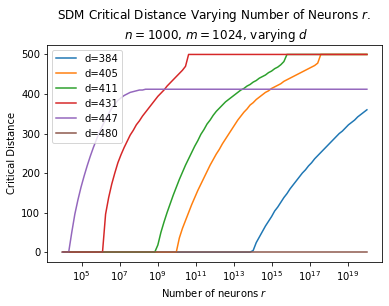

In [12]:
import seaborn as sns
import pandas as pd


#patrang = list(np.logspace(2,10, 5 ).astype(int)) # number of patterns

#hamm_dist = 451 # hamming dist
n=1000 # dimensions
cfracs = [0.0000000000001, 0.000000001, 0.00000001,0.000007, 0.000368, 0.1]
hdists = space_frac_to_hamm_radius(n,cfracs) #[9,11, 15, 19,27]#[405, 447, 480]

rrang = np.logspace(4,20, 100 ) # number of neurons
m = 1024 # number of patterns
drang_interval = 1
ploteach = False

for hamm_dist in hdists:
    heat = []
    crit_dists = []

    for r in rrang: 
        r = int(r)

        bits_distances, crit_dist, dvals = compute_bitdist_critdist(n,hamm_dist,r,
                                                                    m,drang_interval)
        crit_dists.append(crit_dist)

        if ploteach: 
            plt.plot(dvals, bits_distances, label='Update')
            plt.plot(dvals, dvals, label='$x=y$')
            plt.legend()
            plt.xlabel("Query Hamming Distance to Target")
            plt.ylabel("New Query Hamming Distance to Target")
            plt.title("r="+str(r)+" -SDM Query Convergence to Target Pattern")

            #plt.gcf().savefig('figures/p_'+str(p)+'SDMNewQueryConvergence.png', dpi=250)
            plt.show()

        heat.append(bits_distances)

    plt.plot(rrang, crit_dists, label="d="+str(hamm_dist))

plt.xlabel("Number of neurons $r$")
plt.xscale('log')
plt.ylabel("Critical Distance")
plt.title("SDM Critical Distance Varying Number of Neurons $r$. \n $n=$"+str(n)+", $m=$"+str(m)+", varying $d$")
plt.legend()
plt.gcf().savefig('figures/SDMCritDist_VaryR|n='+str(n)+'|Multiple_d|m='+str(m)+'.png', dpi=250)
plt.show()

# Varying the number of dimensions n and Hamming distance r

At some point should further investigate the convergence of n=10000!! Looks interesting. 

target_fs [5.57954453e-04 2.19701391e-04 2.19701391e-04 1.09530326e-04
 1.09530326e-04 5.69293216e-05 5.69293216e-05 2.97158119e-05
 2.97158119e-05 1.53329822e-05 1.53329822e-05 7.74643469e-06
 7.74643469e-06 3.80398724e-06 3.80398724e-06 1.80378267e-06
 1.80378267e-06 8.20488836e-07 8.20488836e-07 3.55473393e-07
 3.55473393e-07 1.45498827e-07 1.45498827e-07 5.57248027e-08
 5.57248027e-08 1.97354211e-08 1.97354211e-08 6.36722392e-09
 6.36722392e-09 1.83485570e-09 1.83485570e-09 4.59642163e-10
 4.59642163e-10 9.62012454e-11 9.62012454e-11 1.57911390e-11
 1.57911390e-11 1.80957402e-12 1.80957402e-12 1.08741680e-13
 1.08741680e-13            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan]


/Users/trentonbricken/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in less
/Users/trentonbricken/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in greater


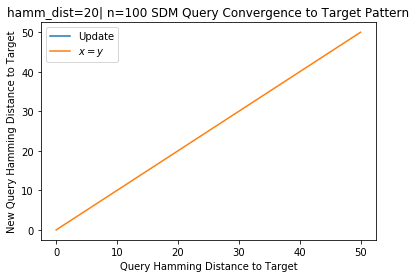

target_fs [7.95266424e-03 3.44115912e-03 3.44115912e-03 1.86571289e-03
 1.86571289e-03 1.05565742e-03 1.05565742e-03 6.02098920e-04
 6.02098920e-04 3.41233872e-04 3.41233872e-04 1.90562807e-04
 1.90562807e-04 1.04223207e-04 1.04223207e-04 5.55325135e-05
 5.55325135e-05 2.86810278e-05 2.86810278e-05 1.42834343e-05
 1.42834343e-05 6.81979295e-06 6.81979295e-06 3.10151609e-06
 3.10151609e-06 1.33323781e-06 1.33323781e-06 5.36716057e-07
 5.36716057e-07 2.00025846e-07 2.00025846e-07 6.80053467e-08
 6.80053467e-08 2.06853393e-08 2.06853393e-08 5.47978813e-09
 5.47978813e-09 1.21541081e-09 1.21541081e-09 2.11919754e-10
 2.11919754e-10 2.58626406e-11 2.58626406e-11 1.65983716e-12
 1.65983716e-12            nan            nan            nan
            nan            nan            nan]


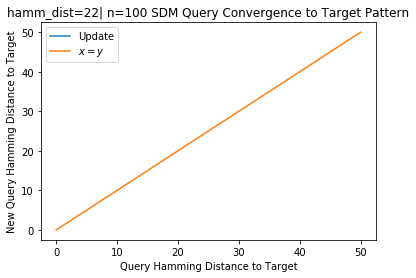

target_fs [9.05001311e-02 4.26716384e-02 4.26716384e-02 2.49245168e-02
 2.49245168e-02 1.51933310e-02 1.51933310e-02 9.35970479e-03
 9.35970479e-03 5.75152928e-03 5.75152928e-03 3.49939335e-03
 3.49939335e-03 2.09708025e-03 2.09708025e-03 1.23246242e-03
 1.23246242e-03 7.07515874e-04 7.07515874e-04 3.95156654e-04
 3.95156654e-04 2.13814774e-04 2.13814774e-04 1.11562161e-04
 1.11562161e-04 5.58346027e-05 5.58346027e-05 2.66384600e-05
 2.66384600e-05 1.20261049e-05 1.20261049e-05 5.09136144e-06
 5.09136144e-06 1.99866095e-06 1.99866095e-06 7.17050216e-07
 7.17050216e-07 2.30626910e-07 2.30626910e-07 6.47498381e-08
 6.47498381e-08 1.52586460e-08 1.52586460e-08 2.83454004e-09
 2.83454004e-09 3.69675539e-10 3.69675539e-10 2.54388611e-11
 2.54388611e-11            nan            nan]


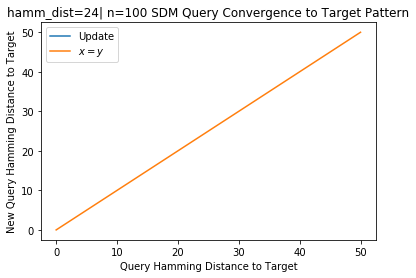

target_fs [8.33681325e-01 4.25299580e-01 4.25299580e-01 2.65516328e-01
 2.65516328e-01 1.72858515e-01 1.72858515e-01 1.13922750e-01
 1.13922750e-01 7.51075290e-02 7.51075290e-02 4.92079658e-02
 4.92079658e-02 3.18930894e-02 3.18930894e-02 2.03749640e-02
 2.03749640e-02 1.27889718e-02 1.27889718e-02 7.86242385e-03
 7.86242385e-03 4.71916459e-03 4.71916459e-03 2.75591441e-03
 2.75591441e-03 1.55991528e-03 1.55991528e-03 8.52095974e-04
 8.52095974e-04 4.46935218e-04 4.46935218e-04 2.23762565e-04
 2.23762565e-04 1.06171220e-04 1.06171220e-04 4.73239266e-05
 4.73239266e-05 1.95977981e-05 1.95977981e-05 7.43347947e-06
 7.43347947e-06 2.53385146e-06 2.53385146e-06 7.55961898e-07
 7.55961898e-07 1.89864684e-07 1.89864684e-07 3.77120737e-08
 3.77120737e-08 5.27750961e-09 5.27750961e-09]
critical distance plot curves wrong way thus crit dist = 0


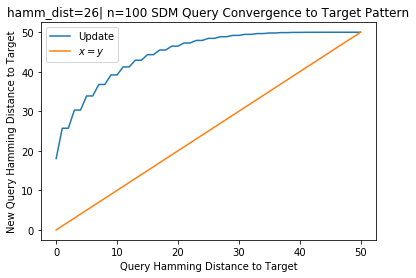

target_fs [1.60800076e+01 9.12880047e+00 9.12880047e+00 6.21992590e+00
 6.21992590e+00 4.40937639e+00 4.40937639e+00 3.16855186e+00
 3.16855186e+00 2.28434112e+00 2.28434112e+00 1.64304542e+00
 1.64304542e+00 1.17468339e+00 1.17468339e+00 8.32430518e-01
 8.32430518e-01 5.83290564e-01 5.83290564e-01 4.03238199e-01
 4.03238199e-01 2.74422959e-01 2.74422959e-01 1.83430162e-01
 1.83430162e-01 1.20130150e-01 1.20130150e-01 7.68773342e-02
 7.68773342e-02 4.79292660e-02 4.79292660e-02 2.90110919e-02
 2.90110919e-02 1.69805927e-02 1.69805927e-02 9.56583378e-03
 9.56583378e-03 5.15737936e-03 5.15737936e-03 2.64301470e-03
 2.64301470e-03 1.27660177e-03 1.27660177e-03 5.74970356e-04
 5.74970356e-04 2.38142514e-04 2.38142514e-04 8.90329556e-05
 8.90329556e-05 2.92755146e-05 2.92755146e-05]


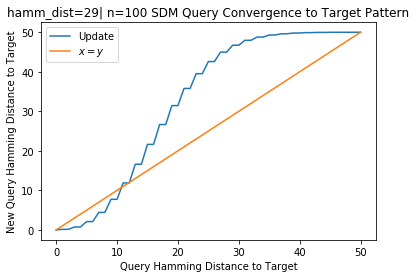

target_fs [9.15716124e+01 5.54701816e+01 5.54701816e+01 3.97823201e+01
 3.97823201e+01 2.96236212e+01 2.96236212e+01 2.23657825e+01
 2.23657825e+01 1.69622724e+01 1.69622724e+01 1.28579799e+01
 1.28579799e+01 9.71058702e+00 9.71058702e+00 7.28877597e+00
 7.28877597e+00 5.42662714e+00 5.42662714e+00 4.00023828e+00
 4.00023828e+00 2.91450982e+00 2.91450982e+00 2.09509574e+00
 2.09509574e+00 1.48319562e+00 1.48319562e+00 1.03200939e+00
 1.03200939e+00 7.04215086e-01 7.04215086e-01 4.70102681e-01
 4.70102681e-01 3.06144164e-01 3.06144164e-01 1.93863529e-01
 1.93863529e-01 1.18919804e-01 1.18919804e-01 7.03468501e-02
 7.03468501e-02 3.99131077e-02 3.99131077e-02 2.15771400e-02
 2.15771400e-02 1.10232009e-02 1.10232009e-02 5.26650689e-03
 5.26650689e-03 2.32131873e-03 2.32131873e-03]


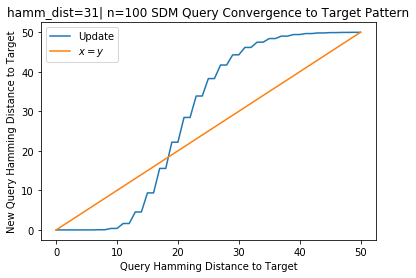

target_fs [8.94965196e+02 5.92615713e+02 5.92615713e+02 4.54872493e+02
 4.54872493e+02 3.61150303e+02 3.61150303e+02 2.90622518e+02
 2.90622518e+02 2.35171324e+02 2.35171324e+02 1.90566628e+02
 1.90566628e+02 1.54231342e+02 1.54231342e+02 1.24432717e+02
 1.24432717e+02 9.99239731e+01 9.99239731e+01 7.97628968e+01
 7.97628968e+01 6.32109021e+01 6.32109021e+01 4.96727565e+01
 4.96727565e+01 3.86585543e+01 3.86585543e+01 2.97586514e+01
 2.97586514e+01 2.26265375e+01 2.26265375e+01 1.69667675e+01
 1.69667675e+01 1.25262243e+01 1.25262243e+01 9.08762983e+00
 9.08762983e+00 6.46459945e+00 6.46459945e+00 4.49776846e+00
 4.49776846e+00 3.05166404e+00 3.05166404e+00 2.01209160e+00
 2.01209160e+00 1.28386981e+00 1.28386981e+00 7.88794125e-01
 7.88794125e-01 4.63743525e-01 4.63743525e-01]


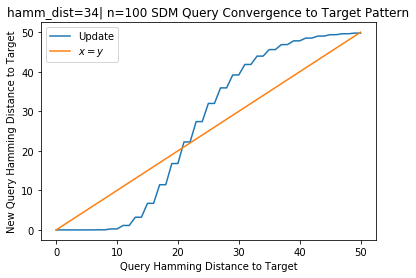

target_fs [1758.82086149 1197.31467875 1197.31467875  938.03332453  938.03332453
  759.10914259  759.10914259  622.46155908  622.46155908  513.34792062
  513.34792062  424.13852831  424.13852831  350.21501501  350.21501501
  288.48929073  288.48929073  236.74861008  236.74861008  193.3247535
  193.3247535   156.91036513  156.91036513  126.44953747  126.44953747
  101.06898455  101.06898455   80.0328506    80.0328506    62.71200254
   62.71200254   48.56257737   48.56257737   37.11065023   37.11065023
   27.94106503   27.94106503   20.6891575    20.6891575    15.03451842
   15.03451842   10.69620516   10.69620516    7.4289775     7.4289775
    5.02024387    5.02024387    3.28747897    3.28747897    2.07592674
    2.07592674]


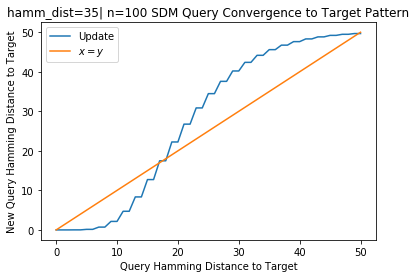

target_fs [10489.36783893  7716.18225365  7716.18225365  6391.04430547
  6391.04430547  5443.29744819  5443.29744819  4691.89232507
  4691.89232507  4067.9169394   4067.9169394   3536.37219328
  3536.37219328  3076.49640169  3076.49640169  2674.69558023
  2674.69558023  2321.4316227   2321.4316227   2009.65688891
  2009.65688891  1733.9479484   1733.9479484   1489.9905642
  1489.9905642   1274.25586439  1274.25586439  1083.78739069
  1083.78739069   916.05585807   916.05585807   768.85709497
   768.85709497   640.23856789   640.23856789   528.44546709
   528.44546709   431.88059316   431.88059316   349.07426853
   349.07426853   278.66174297   278.66174297   219.36636577
   219.36636577   169.98732642   169.98732642   129.39112016
   129.39112016    96.50613088    96.50613088]
critical distance plot curves wrong way thus crit dist = 0


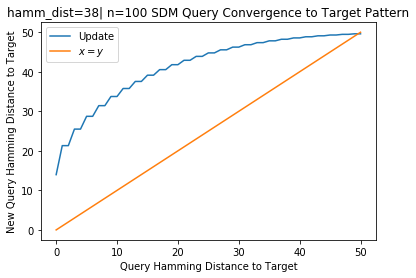

target_fs [135626.51203692 113813.07855502 113813.07855502 102931.09359807
 102931.09359807  94790.63964509  94790.63964509  88026.67902571
  88026.67902571  82127.58200118  82127.58200118  76837.84225171
  76837.84225171  72008.7259074   72008.7259074   67544.9236303
  67544.9236303   63381.20890123  63381.20890123  59470.76744543
  59470.76744543  55778.77966356  55778.77966356  52278.6301421
  52278.6301421   48949.54055965  48949.54055965  45775.02409019
  45775.02409019  42741.83883341  42741.83883341  39839.25752933
  39839.25752933  37058.54504812  37058.54504812  34392.57662891
  34392.57662891  31835.55403453  31835.55403453  29382.79142304
  29382.79142304  27030.5518694   27030.5518694   24775.92132119
  24775.92132119  22616.71060082  22616.71060082  20551.37860742
  20551.37860742  18578.97156582  18578.97156582]
critical distance plot curves wrong way thus crit dist = 0


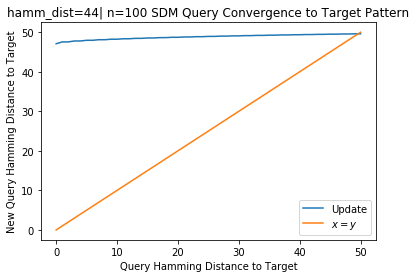

target_fs [308649.70679462 273356.7417994  273356.7417994  255575.66440334
 255575.66440334 242136.7444384  242136.7444384  230849.85756975
 230849.85756975 220895.34046937 220895.34046937 211864.07748248
 211864.07748248 203517.76983448 203517.76983448 195703.40503845
 195703.40503845 188315.87529431 188315.87529431 181279.30567612
 181279.30567612 174536.79517099 174536.79517099 168044.3609606
 168044.3609606  161767.15782279 161767.15782279 155677.00924835
 155677.00924835 149750.73453477 149750.73453477 143968.97984036
 143968.97984036 138315.37998146 138315.37998146 132775.94412322
 132775.94412322 127338.59722711 127338.59722711 121992.83256105
 121992.83256105 116729.44525213 116729.44525213 111540.32632888
 111540.32632888 106418.30298524 106418.30298524 101357.01509627
 101357.01509627  96350.82105225  96350.82105225]
critical distance plot curves wrong way thus crit dist = 0


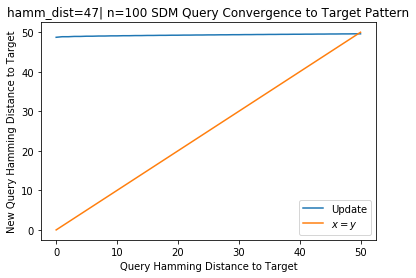

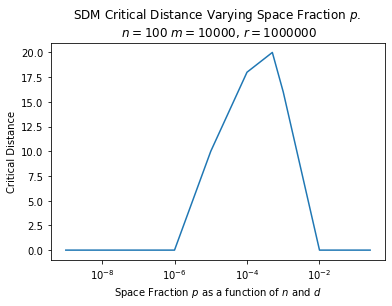

target_fs [1.02229114e-03 8.23931936e-04 8.23931936e-04 7.28206401e-04
 7.28206401e-04 6.58922773e-04 6.58922773e-04 6.03213608e-04
 6.03213608e-04 5.56186604e-04 5.56186604e-04 5.15360556e-04
 5.15360556e-04 4.79266904e-04 4.79266904e-04 4.46947579e-04
 4.46947579e-04 4.17734092e-04 4.17734092e-04 3.91136463e-04
 3.91136463e-04 3.66781779e-04 3.66781779e-04 3.44377680e-04
 3.44377680e-04 3.23689396e-04 3.23689396e-04 3.04524649e-04
 3.04524649e-04 2.86723341e-04 2.86723341e-04 2.70150292e-04
 2.70150292e-04 2.54689983e-04 2.54689983e-04 2.40242672e-04
 2.40242672e-04 2.26721456e-04 2.26721456e-04 2.14050016e-04
 2.14050016e-04 2.02160858e-04 2.02160858e-04 1.90993919e-04
 1.90993919e-04 1.80495451e-04 1.80495451e-04 1.70617117e-04
 1.70617117e-04 1.61315255e-04 1.61315255e-04 1.52550260e-04
 1.52550260e-04 1.44286079e-04 1.44286079e-04 1.36489782e-04
 1.36489782e-04 1.29131202e-04 1.29131202e-04 1.22182621e-04
 1.22182621e-04 1.15618514e-04 1.15618514e-04 1.09415314e-04
 1.09415314e-0

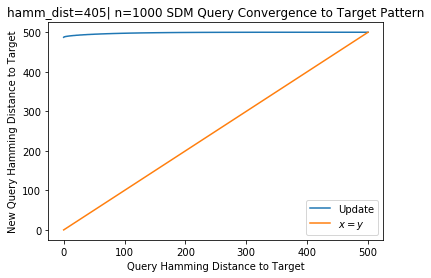

target_fs [1.00266618e-02 8.19839146e-03 8.19839146e-03 7.31206539e-03
 7.31206539e-03 6.66762576e-03 6.66762576e-03 6.14706379e-03
 6.14706379e-03 5.70559948e-03 5.70559948e-03 5.32056777e-03
 5.32056777e-03 4.97858102e-03 4.97858102e-03 4.67092279e-03
 4.67092279e-03 4.39152307e-03 4.39152307e-03 4.13594098e-03
 4.13594098e-03 3.90080259e-03 3.90080259e-03 3.68346702e-03
 3.68346702e-03 3.48181674e-03 3.48181674e-03 3.29411977e-03
 3.29411977e-03 3.11893562e-03 3.11893562e-03 2.95504919e-03
 2.95504919e-03 2.80142296e-03 2.80142296e-03 2.65716164e-03
 2.65716164e-03 2.52148552e-03 2.52148552e-03 2.39371002e-03
 2.39371002e-03 2.27322976e-03 2.27322976e-03 2.15950594e-03
 2.15950594e-03 2.05205628e-03 2.05205628e-03 1.95044685e-03
 1.95044685e-03 1.85428542e-03 1.85428542e-03 1.76321591e-03
 1.76321591e-03 1.67691390e-03 1.67691390e-03 1.59508269e-03
 1.59508269e-03 1.51745014e-03 1.51745014e-03 1.44376584e-03
 1.44376584e-03 1.37379881e-03 1.37379881e-03 1.30733545e-03
 1.30733545e-0

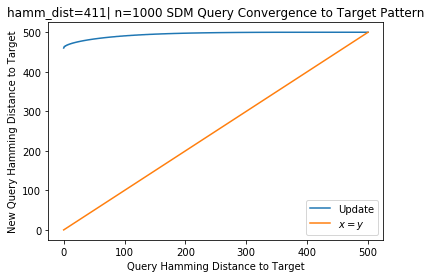

target_fs [1.19832886e-01 9.96114342e-02 9.96114342e-02 8.97600170e-02
 8.97600170e-02 8.25617241e-02 8.25617241e-02 7.67182558e-02
 7.67182558e-02 7.17379759e-02 7.17379759e-02 6.73725808e-02
 6.73725808e-02 6.34757255e-02 6.34757255e-02 5.99523365e-02
 5.99523365e-02 5.67363499e-02 5.67363499e-02 5.37795351e-02
 5.37795351e-02 5.10453244e-02 5.10453244e-02 4.85051514e-02
 4.85051514e-02 4.61361530e-02 4.61361530e-02 4.39196611e-02
 4.39196611e-02 4.18401745e-02 4.18401745e-02 3.98846362e-02
 3.98846362e-02 3.80419118e-02 3.80419118e-02 3.63024044e-02
 3.63024044e-02 3.46577640e-02 3.46577640e-02 3.31006655e-02
 3.31006655e-02 3.16246351e-02 3.16246351e-02 3.02239140e-02
 3.02239140e-02 2.88933489e-02 2.88933489e-02 2.76283036e-02
 2.76283036e-02 2.64245874e-02 2.64245874e-02 2.52783951e-02
 2.52783951e-02 2.41862582e-02 2.41862582e-02 2.31450031e-02
 2.31450031e-02 2.21517166e-02 2.21517166e-02 2.12037163e-02
 2.12037163e-02 2.02985248e-02 2.02985248e-02 1.94338486e-02
 1.94338486e-0

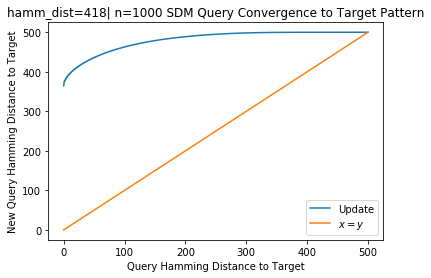

target_fs [1.17814658e+00 9.95279311e-01 9.95279311e-01 9.05790080e-01
 9.05790080e-01 8.40106319e-01 8.40106319e-01 7.86543468e-01
 7.86543468e-01 7.40685018e-01 7.40685018e-01 7.00304678e-01
 7.00304678e-01 6.64092911e-01 6.64092911e-01 6.31200680e-01
 6.31200680e-01 6.01039203e-01 6.01039203e-01 5.73179500e-01
 5.73179500e-01 5.47296966e-01 5.47296966e-01 5.23138518e-01
 5.23138518e-01 5.00501981e-01 5.00501981e-01 4.79222579e-01
 4.79222579e-01 4.59163724e-01 4.59163724e-01 4.40210559e-01
 4.40210559e-01 4.22265290e-01 4.22265290e-01 4.05243748e-01
 4.05243748e-01 3.89072801e-01 3.89072801e-01 3.73688371e-01
 3.73688371e-01 3.59033891e-01 3.59033891e-01 3.45059090e-01
 3.45059090e-01 3.31719021e-01 3.31719021e-01 3.18973279e-01
 3.18973279e-01 3.06785360e-01 3.06785360e-01 2.95122138e-01
 2.95122138e-01 2.83953424e-01 2.83953424e-01 2.73251605e-01
 2.73251605e-01 2.62991334e-01 2.62991334e-01 2.53149268e-01
 2.53149268e-01 2.43703849e-01 2.43703849e-01 2.34635110e-01
 2.34635110e-0

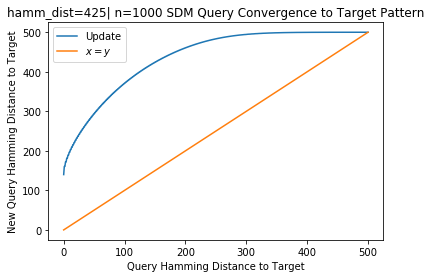

target_fs [1.26718894e+01 1.08997526e+01 1.08997526e+01 1.00285171e+01
 1.00285171e+01 9.38607427e+00 9.38607427e+00 8.85974181e+00
 8.85974181e+00 8.40700676e+00 8.40700676e+00 8.00648014e+00
 8.00648014e+00 7.64560563e+00 7.64560563e+00 7.31625890e+00
 7.31625890e+00 7.01281760e+00 7.01281760e+00 6.73119388e+00
 6.73119388e+00 6.46830102e+00 6.46830102e+00 6.22173739e+00
 6.22173739e+00 5.98958848e+00 5.98958848e+00 5.77029709e+00
 5.77029709e+00 5.56257502e+00 5.56257502e+00 5.36534115e+00
 5.36534115e+00 5.17767673e+00 5.17767673e+00 4.99879247e+00
 4.99879247e+00 4.82800384e+00 4.82800384e+00 4.66471203e+00
 4.66471203e+00 4.50838933e+00 4.50838933e+00 4.35856748e+00
 4.35856748e+00 4.21482840e+00 4.21482840e+00 4.07679682e+00
 4.07679682e+00 3.94413408e+00 3.94413408e+00 3.81653326e+00
 3.81653326e+00 3.69371493e+00 3.69371493e+00 3.57542376e+00
 3.57542376e+00 3.46142557e+00 3.46142557e+00 3.35150485e+00
 3.35150485e+00 3.24546272e+00 3.24546272e+00 3.14311504e+00
 3.14311504e+0

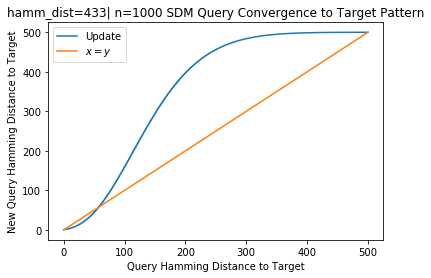

target_fs [1.06198302e+02 9.29648899e+01 9.29648899e+01 8.64324024e+01
 8.64324024e+01 8.15956572e+01 8.15956572e+01 7.76167684e+01
 7.76167684e+01 7.41801127e+01 7.41801127e+01 7.11271544e+01
 7.11271544e+01 6.83649825e+01 6.83649825e+01 6.58335855e+01
 6.58335855e+01 6.34915065e+01 6.34915065e+01 6.13086584e+01
 6.13086584e+01 5.92623640e+01 5.92623640e+01 5.73350121e+01
 5.73350121e+01 5.55125899e+01 5.55125899e+01 5.37837212e+01
 5.37837212e+01 5.21390128e+01 5.21390128e+01 5.05705961e+01
 5.05705961e+01 4.90717969e+01 4.90717969e+01 4.76368921e+01
 4.76368921e+01 4.62609271e+01 4.62609271e+01 4.49395759e+01
 4.49395759e+01 4.36690326e+01 4.36690326e+01 4.24459260e+01
 4.24459260e+01 4.12672517e+01 4.12672517e+01 4.01303170e+01
 4.01303170e+01 3.90326960e+01 3.90326960e+01 3.79721937e+01
 3.79721937e+01 3.69468146e+01 3.69468146e+01 3.59547381e+01
 3.59547381e+01 3.49942967e+01 3.49942967e+01 3.40639581e+01
 3.40639581e+01 3.31623097e+01 3.31623097e+01 3.22880456e+01
 3.22880456e+0

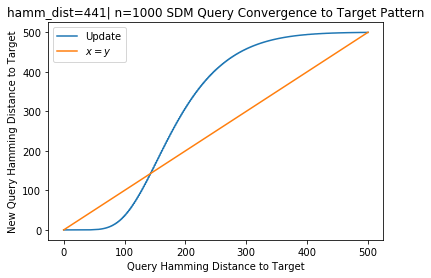

target_fs [5.57524590e+02 4.95407142e+02 4.95407142e+02 4.64647791e+02
 4.64647791e+02 4.41801581e+02 4.41801581e+02 4.22948140e+02
 4.22948140e+02 4.06612419e+02 4.06612419e+02 3.92054400e+02
 3.92054400e+02 3.78840931e+02 3.78840931e+02 3.66692594e+02
 3.66692594e+02 3.55416614e+02 3.55416614e+02 3.44873275e+02
 3.44873275e+02 3.34957412e+02 3.34957412e+02 3.25587469e+02
 3.25587469e+02 3.16698645e+02 3.16698645e+02 3.08238405e+02
 3.08238405e+02 3.00163437e+02 3.00163437e+02 2.92437509e+02
 2.92437509e+02 2.85029938e+02 2.85029938e+02 2.77914448e+02
 2.77914448e+02 2.71068327e+02 2.71068327e+02 2.64471776e+02
 2.64471776e+02 2.58107399e+02 2.58107399e+02 2.51959814e+02
 2.51959814e+02 2.46015328e+02 2.46015328e+02 2.40261691e+02
 2.40261691e+02 2.34687882e+02 2.34687882e+02 2.29283942e+02
 2.29283942e+02 2.24040833e+02 2.24040833e+02 2.18950319e+02
 2.18950319e+02 2.14004868e+02 2.14004868e+02 2.09197569e+02
 2.09197569e+02 2.04522060e+02 2.04522060e+02 1.99972467e+02
 1.99972467e+0

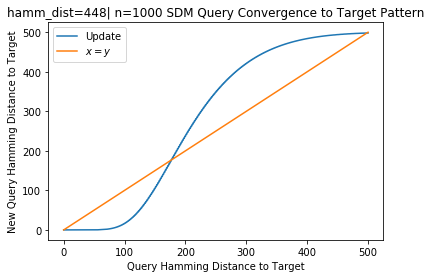

target_fs [1071.85004892  958.43652739  958.43652739  902.20810454  902.20810454
  860.39402892  860.39402892  825.8454042   825.8454042   795.87363331
  795.87363331  769.13048834  769.13048834  744.827182    744.827182
  722.45512593  722.45512593  701.66361394  701.66361394  682.19858916
  682.19858916  663.86892494  663.86892494  646.52647566  646.52647566
  630.05359321  630.05359321  614.35495472  614.35495472  599.3520103
  599.3520103   584.97909175  584.97909175  571.18061216  571.18061216
  557.90900439  557.90900439  545.12317289  545.12317289  532.7873109
  532.7873109   520.8699825   520.8699825   509.34340057  509.34340057
  498.18285173  498.18285173  487.36623314  487.36623314  476.8736758
  476.8736758   466.68723518  466.68723518  456.79063512  456.79063512
  447.16905415  447.16905415  437.80894594  437.80894594  428.69788736
  428.69788736  419.82444928  419.82444928  411.17808588  411.17808588
  402.74903946  402.74903946  394.52825815  394.52825815  386.50732436
 

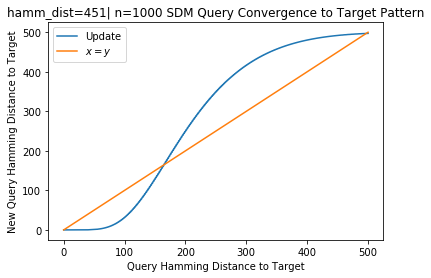

target_fs [10463.55530305  9586.93521889  9586.93521889  9150.52876626
  9150.52876626  8824.65178925  8824.65178925  8554.27765521
  8554.27765521  8318.74164949  8318.74164949  8107.69654844
  8107.69654844  7915.0977964   7915.0977964   7737.05402761
  7737.05402761  7570.886089    7570.886089    7414.65626143
  7414.65626143  7266.9091717   7266.9091717   7126.51860088
  7126.51860088  6992.59168053  6992.59168053  6864.40621332
  6864.40621332  6741.36811437  6741.36811437  6622.981602
  6622.981602    6508.82775907  6508.82775907  6398.54875971
  6398.54875971  6291.83603204  6291.83603204  6188.42121894
  6188.42121894  6088.06916844  6088.06916844  5990.57242267
  5990.57242267  5895.7468315   5895.7468315   5803.42802219
  5803.42802219  5713.46852923  5713.46852923  5625.73543937
  5625.73543937  5540.10844309  5540.10844309  5456.47820978
  5456.47820978  5374.74502326  5374.74502326  5294.81762834
  5294.81762834  5216.61224979  5216.61224979  5140.05175316
  5140.05175316 

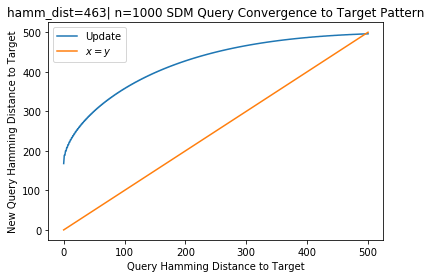

target_fs [108724.14660211 102826.83576909 102826.83576909  99879.72417911
  99879.72417911  97670.55685203  97670.55685203  95830.56317179
  95830.56317179  94221.43167493  94221.43167493  92773.99567772
  92773.99567772  91447.90173275  91447.90173275  90217.20445721
  90217.20445721  89064.06381325  89064.06381325  87975.59352062
  87975.59352062  86942.12755899  86942.12755899  85956.19575521
  85956.19575521  85011.88347952  85011.88347952  84104.41295585
  84104.41295585  83229.85913083  83229.85913083  82384.950768
  82384.950768    81566.92747446  81566.92747446  80773.43456588
  80773.43456588  80002.4442099   80002.4442099   79252.19524191
  79252.19524191  78521.14651904  78521.14651904  77807.94026723
  77807.94026723  77111.37292353  77111.37292353  76430.37168151
  76430.37168151  75763.97543319  75763.97543319  75111.31914032
  75111.31914032  74471.62090981  74471.62090981  73844.17122244
  73844.17122244  73228.32389222  73228.32389222  72623.488428
  72623.488428    7

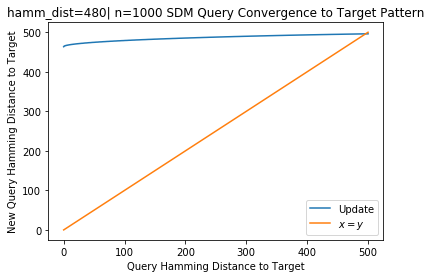

target_fs [253330.02131232 243208.40900405 243208.40900405 238144.77042849
 238144.77042849 234344.91510027 234344.91510027 231176.59526912
 231176.59526912 228402.76190266 228402.76190266 225904.91236056
 225904.91236056 223613.93282867 223613.93282867 221485.40115707
 221485.40115707 219488.78271253 219488.78271253 217602.02873477
 217602.02873477 215808.60566902 215808.60566902 214095.73991099
 214095.73991099 212453.32085996 212453.32085996 210873.18374104
 210873.18374104 209348.62298762 209348.62298762 207874.05163605
 207874.05163605 206444.75653509 206444.75653509 205056.71836698
 205056.71836698 203706.47667414 203706.47667414 202391.02686114
 202391.02686114 201107.74037784 201107.74037784 199854.30201084
 199854.30201084 198628.66000579 198628.66000579 197428.9859515
 197428.9859515  196253.6421884  196253.6421884  195101.15508548
 195101.15508548 193970.19294425 193970.19294425 192859.54758673
 192859.54758673 191768.11890383 191768.11890383 190694.90180235
 190694.90180235

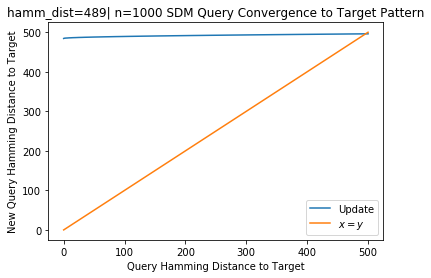

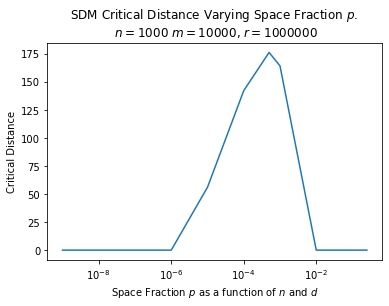

target_fs [nan nan nan ... nan nan nan]


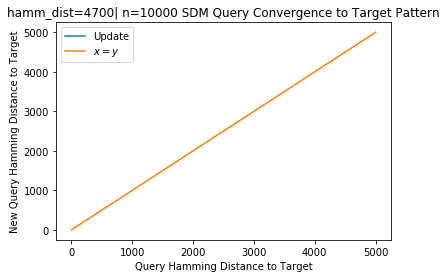

KeyboardInterrupt: 

In [9]:
#hamm_dist = 451 # hamming dist
n=1000 # dimensions
r = 1000000 # number of neurons
m = 10000 # number of patterns

drang_interval = 1

ploteach = True

# portions of space within r bits for: 0.000000001, 0.00001, 0.001, 0.1
nvals = [100, 1000]
hamm_distances = {100:[20, 22, 24, 26, 29, 31, 34, 35, 38, 44, 47],
        1000:[405, 411,418, 425,433,441,448,451,463,480,489],
        10000:[4700,4720, 4740, 4760, 4790, 4810, 4840, 4850, 4880, 4940, 4970]}

space_fracs= [0.000000001, 0.00000001, 0.0000001, 0.000001, 0.00001, 0.0001, 0.0005,
             0.001, 0.01, 0.1, 0.25]

for n in nvals:
    
    crit_dists = []
    heat = []
    
    for hamm_dist in hamm_distances[n]:
        
        bits_distances, crit_dist, dvals = compute_bitdist_critdist(n,hamm_dist,r,m,
                                                                    drang_interval, print_things=True)
        
        
        # kind of hacky hard code: 
        # but I am checking the plots by eye so its ok? 
        if hamm_dist<25:
            crit_dist=0
        
        crit_dists.append(crit_dist)

        if ploteach: 
            plt.plot(dvals, bits_distances, label='Update')
            plt.plot(dvals, dvals, label='$x=y$')
            plt.legend()
            plt.xlabel("Query Hamming Distance to Target")
            plt.ylabel("New Query Hamming Distance to Target")
            plt.title("hamm_dist="+str(hamm_dist)+'| n='+str(n)+" SDM Query Convergence to Target Pattern")

            #plt.gcf().savefig('figures/p_'+str(p)+'SDMNewQueryConvergence.png', dpi=250)
            plt.show()

        #heat.append(bits_distances)
    
    plt.plot(space_fracs, crit_dists)
    plt.xlabel("Space Fraction $p$ as a function of $n$ and $d$")
    plt.ylabel("Critical Distance")
    plt.xscale('log')
    plt.title("SDM Critical Distance Varying Space Fraction $p$. \n $n=$"+str(n)+" $m=$"+str(m)+", $r=$"+str(r))
    plt.gcf().savefig('figures/SDMCritDist_VaryP_N='+str(n)+'.png', dpi=250)
    plt.show()

# Extra Figures And Analysis

## Old Variance Calculations: With and without using Lune Intersection Calc

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import binom, norm
import scipy.integrate as integrate

from SDM_Circ_Inter_Funcs import *

def compute_bitdist_critdist_SDM_Version(n,hamm_dist,r,m,
                             drang_interval, use_lune=True):
    
    if n<10000:
        dvals = np.arange(0,n//2, drang_interval)
    else: 
        dvals = np.arange(0,n, drang_interval)
    
    # computing noise portion
    c_p = (hamm_dist-(n/2))/np.sqrt(n/4)
    cfrac = binom.cdf(hamm_dist, n, 0.5)
    h = -f(0.5, c_p)
    std = np.sqrt( (1+ (((h**2) *r)/(4*cfrac**2 *n))) *(cfrac**2)*r*m )

    if use_lune: 
        bits_distances = expected_intersection_lune(n, dvals, hamm_dist, r)
        
    else: # uses continuous approx:
        bits_distances = []
        for d in dvals:
            intersect = integrate.quad(f, d/n,1, args=(c_p))
            bits_distance = intersect[0]*r
            bits_distances.append(bits_distance)

    snrs = bits_distances / std
    fidelities = norm.cdf(snrs)
    bits_distances = n - (fidelities*n)
    npp = np.asarray( bits_distances - dvals )
    crit_dist = (np.argmax(npp[1:] - npp[:-1])+2)*drang_interval
    
    # checks if the critical distance is in fact 0 as it curves the wrong way. 
    check_ind = crit_dist//(drang_interval*2)
    if bits_distances[check_ind] > dvals[check_ind]:
        crit_dist = 0
        print('critical distance plot curves wrong way thus crit dist = 0')
    
    return bits_distances, crit_dist


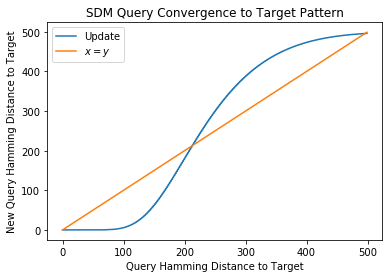

200

In [34]:


drang_interval = 1
bits_distances, crit_dist = compute_bitdist_critdist_SDM_Version(n,hamm_dist,r,
                                             m,drang_interval, 
                                            use_lune=True)

rang = np.arange(0,n//2, drang_interval)

plt.plot(rang, bits_distances, label='Update')
plt.plot(rang, rang, label='$x=y$')
plt.legend()
plt.xlabel("Query Hamming Distance to Target")
plt.ylabel("New Query Hamming Distance to Target")
plt.title("SDM Query Convergence to Target Pattern")
plt.gcf().savefig('figures/Old_Variance_Lune_SDMNewQueryConvergence.png', dpi=250)
plt.show()

crit_dist

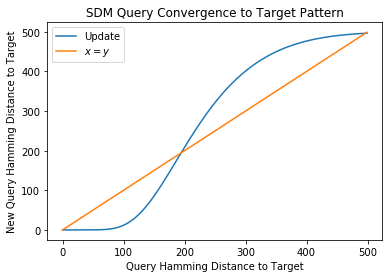

188

In [35]:

# when lune is false. 
# Now know that this is the wrong intersection calculation. 

bits_distances, crit_dist = compute_bitdist_critdist_SDM_Version(n,hamm_dist,r,
                                             m,drang_interval, 
                                            use_lune=False)

rang = np.arange(0,n//2, drang_interval)

plt.plot(rang, bits_distances, label='Update')
plt.plot(rang, rang, label='$x=y$')
plt.legend()
plt.xlabel("Query Hamming Distance to Target")
plt.ylabel("New Query Hamming Distance to Target")
plt.title("SDM Query Convergence to Target Pattern")
plt.gcf().savefig('figures/Old_Variance_NoLune_SDMNewQueryConvergence.png', dpi=250)
plt.show()

crit_dist

# Varying the Number of neurons r and the dimensions for different Hamming distances.

/Users/trentonbricken/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide
/Users/trentonbricken/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater


critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist =

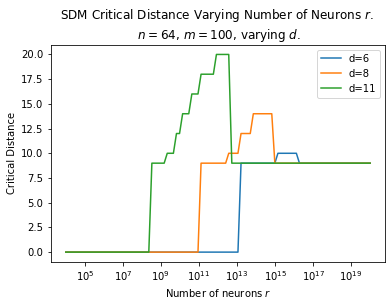

critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist =

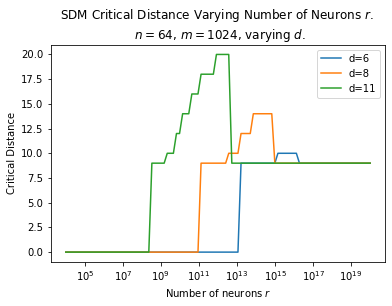

critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist =

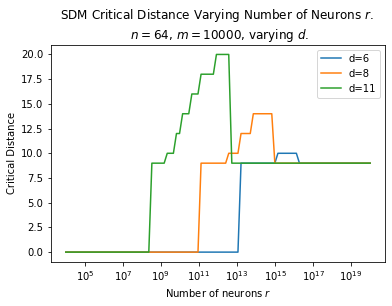

critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist =

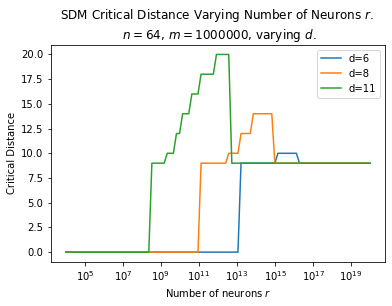

critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist =

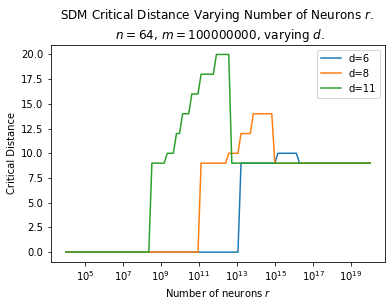

critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist = 0
critical distance plot curves wrong way thus crit dist =

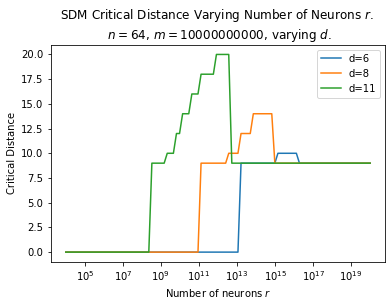

In [14]:
import seaborn as sns
import pandas as pd

#hamm_dist = 411 # hamming dist
n=64 # dimensions
#r = 1000000 # number of neurons
patrang = list(np.logspace(2,10, 5 ).astype(int)) # number of patterns
patrang.append(1024)
patrang = np.sort(patrang)
drang_interval = 1
ploteach = True

rrang = np.logspace(4,20, 100 )

space_frac_rang = [0.000000000001, 0.0000000001, 0.00000001]
hamm_distances = []

for space_frac in space_frac_rang:
    hamm_distances.append( int(binom.ppf(space_frac, n, 0.5)) )

#hamm_distances = [350, 400, 450, 490]
for pat in patrang: 
    for hamm_dist in hamm_distances:

        heat = []
        crit_dists = []

        for r in rrang:

            bits_distances, crit_dist, dvals = compute_bitdist_critdist(n,hamm_dist,r,pat,drang_interval)
            crit_dists.append(crit_dist)

            if ploteach: 
                plt.plot(dvals, bits_distances, label='Update')
                plt.plot(dvals, dvals, label='$x=y$')
                plt.legend()
                plt.xlabel("Query Hamming Distance to Target")
                plt.ylabel("New Query Hamming Distance to Target")
                plt.title("m="+str(m)+" -SDM Query Convergence to Target Pattern")

                #plt.gcf().savefig('figures/p_'+str(p)+'SDMNewQueryConvergence.png', dpi=250)
                plt.show()

            heat.append(bits_distances)

        plt.plot(rrang, crit_dists, label="d="+str(hamm_dist))
        
    plt.xlabel("Number of neurons $r$")
    plt.xscale('log')
    plt.ylabel("Critical Distance")
    plt.title("SDM Critical Distance Varying Number of Neurons $r$. \n $n=$"+str(n)+", $m=$"+str(pat)+", varying $d$.")
    plt.legend()
    plt.gcf().savefig('figures/SDMCritDist_VaryR|n='+str(n)+'|varyingD|m='+str(pat)+'.png', dpi=250)
    plt.show()